# Visión por Computador - Práctica 1 - Filtrado de Imágenes

#### 12 puntos   |   Fecha de entrega: 03 de Noviembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>Guillermo Ramblado Carrasco</mark>



---

## Normas de entrega

1. Para este trabajo, al igual que para los demás, se debe presentar código, resultados, discusión de los mismos, y presentación y análisis del trabajo realizado, todo integrado en el propio Google Colab Notebook (es decir, no se entrega ninguna memoria separada en `.pdf` ni ningún código `.py`). Se recuerda que código y resultados sin informe explicativo no puntúa.

2. En relación con el punto anterior, solo se acepta la entrega de ficheros `.ipynb` (no resulta válido entregar un fichero `.py`).

3. El diseño de celdas del documento debe ser respetado.

4. Solo se entregará el fichero `.ipynb` (incorporando código, resultados, y explicación del trabajo realizado y los resultados obtenidos) y no se enviarán las imágenes empleadas.

5. El path para la lectura de imágenes, o cualquier otro fichero de entrada, debe ser siempre “/content/drive/My Drive/images/nombre_fichero”

6. El código deberá  presentarse adecudamente comentado y con los resultados obtenidos en cada apartado, junto con la presentación del trabajo realizado y la discusión y análisis de los resultados obtenidos. Es importante reiterar que la entrega de código sin informe explicativo o valoraciones no puntúa. Por otro lado, el código debe ir comentado en comentarios en celdas de código, mientras que el análisis y discusión, tanto del trabajo realizado como de los resultados obtenidos, debe ir en celdas de texto.

Este trabajo de implementación tiene como objetivo principal **familiarizarse con la implementación y uso de filtros de convolución, así como del cálculo de las derivadas de una imagen y sus posibles aplicaciones**.








---



## Funciones de apoyo y conexión con Google Drive

In [ ]:
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# We import the modules to use
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt
# change directory
%cd '/content/drive/My Drive'
#  the current directory
%pwd

# This allows to display images  and to save  them in cells
%matplotlib inline
# this definition allows to read files in a specific path
get_image = lambda route: os.path.join('/content/drive/My Drive/images', route)

/content/drive/My Drive


Las funciones que se incluyen a continuación, se proporcionan como ayuda/apoyo para el estudiante. **En caso de que el alumnado prefiera utilizar otras funciones para lectura, normalización y visualización de imágenes, tiene total libertad para hacerlo, pero sí debe justificar y explicar razonadamente el motivo de dicho cambio y describir las modificaciones realizadas.**

Recuérdese que todas las imágenes a emplear durante las prácticas de todo el curso se pueden encontrar en el enlace de Google Drive indicado en PRADO: https://pradogrado2425.ugr.es/mod/url/view.php?id=91457 En concreto, https://drive.google.com/drive/folders/1UtvY8q6w1Cz9a9T9zxIqSweoRLgNwoW-

In [ ]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [ ]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [ ]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [ ]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

IMPORTANT NOTE: it is important to notice that this function stacks all images
and later call displayIm(). This implies that the normalization (rangeDisplay01()) is done
at the very end of the process. As a consequence, if the stacked images have different
range values they can be displayed in a "weird" way (with black regions (pixel value = 0)
looking grey). In case the visualization seems to be a problem, a possible solution
would be to create vim using vim.append(rangeDisplay01(...)). In this way, all images
would be on the same range of values (negative values around 0 (black),
0 values around 0.5 (grey), and positive values closer to 1 (white))

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

# **Ejercicio 1: discretización de máscaras y filtrado Gaussiano** (6 puntos)

En este ejercicio aprenderemos a discretizar máscaras de convolución y a aplicarlas sobre imágenes empleando funciones de OpenCV. También buscamos hacerlo de un modo eficiente, y es por ello que, en toda la práctica, se exige el uso de convoluciones 1D (separables).





## A) (1.5 puntos)

En este apartado se deben realizar las siguientes tareas:

1. Calcular las máscaras discretas 1D de la Gaussiana, así como su primera y segunda derivadas (normalizadas), considerando que la entrada a dicha función de creación de máscaras 1D puede ser tanto un posible sigma como un posible tamaño de máscara.
2. Emplear los siguientes valores de sigma ($\{1, 1.5, 2.5, 6\}$) y los siguientes valores de tamaño de máscara ($\{7, 11, 15\}$), y mostrar el perfil (es decir, la silueta de las máscaras como funciones 1D) para verificar que las máscaras creadas son correctas.
3. Describir/explicar/analizar si las formas de dichos kernels tienen sentido y se corresponden con lo que esperaríamos ver.

**<mark>Función gaussiana**


---



La función gaussiana es una función que trabaja sobre un conjunto de datos continuo. Matemáticamente hablando, esto es equivalente a decir que entre cualquier pareja de valores existe otro valor del conjunto sobre el que podemos evaluar también la función. Justamente este hecho representa un problema a la hora de aplicar dicha función sobre nuestra imagen, formada por un conjunto de pixeles, es decir: un conjunto discreto. Por ello, necesitaremos comenzar discretizando dicha función gaussiana, tal y como se aprecia en el siguiente gráfico:

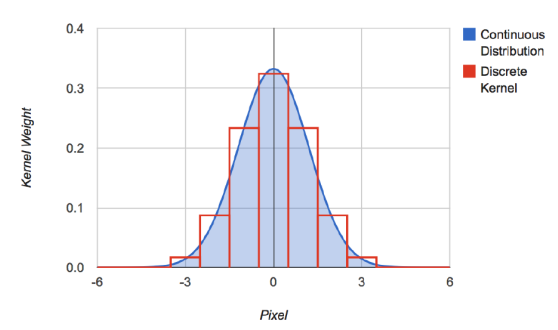

La imagen previa hace referencia a la función gaussiana 1D, sobre la cual aplicaremos el proceso de discretización. Sin embargo, los píxeles que conforman una imagen se pueden ver como puntos en un espacio bidimensional, por lo que necesitamos recurrir realmente a la gaussiana 2D, que definiremos a partir de la versión discreta de la gaussiana 1D, y cuya gráfica es la siguiente:

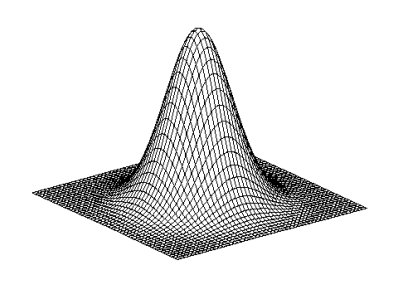

Antes de nada, considero improtante recordar los parámetros que requiere la función gaussiana general:
$$ f(x) = a e^{-\frac{(x - b)^2}{2c^2}} $$

1. a: valor del punto más alto de la camapana.
2. b: posicion del centro de la campana.
3. c: desviación estandar. Este parámetro es justamente el que determina la anchura de la campana de Gauss, tal que cuanto mayor sea este valor, más ancha será la campana, tomando menos altura.

En nuestro caso, usaremos los siguientes valores para dichos parámetros:

* a = $\frac{1}{\sqrt{2 \pi \sigma^2}}$

* b = 0, lo que supone que el píxel central será donde la campana de Gauss alcance su máximo valor

Estos valores concretos hacen referencia a la función de densidad de la distribución normal, con $\sigma$ = c y $\mu$ = b, por lo que podemos trabajar directamente con ella, en lugar de generalizar a la función gaussiana inicial.

Retomemos el proceso de discretización que queremos llevar a cabo...

El área encerrada por dicha función tiene como valor '1', área recubierta casi en su totalidad por todos los valores situados a una distancia máxima del centro de 3$\sigma$. Por tanto, a la hora de discretizar, es importante que la máscara gaussiana que empleemos trabaje con los suficientes píxeles como para cubrir dicho área.
Podría ocurrir cualquiera de las situaciones siguientes:

- Hemos fijado el $\sigma$ de la función gaussiana que asignará los pesos que definen nuestra máscara gaussiana, por lo que nos faltaría únicamente por fijar el tamaño de dicho kernel.Suponiendo que el tamaño del kernel es 2k+1 (píxeles indexados desde -k hasta k), esto implica que habrá k píxeles a ambos laterales del píxel central, por lo que dicho k tendrá que ser el primer valor superior a 3$\sigma$.

- Hemos fijado el tamaño del kernel gaussiano a emplear, siendo necesario por tanto especificar el valor del $\sigma$ de la función gaussiana, calculado de la siguiente forma:

    **tam_mascara=2k+1 -> k=(tam_mascara-1)/2 -> $\sigma$=k/3**


Por último, y no menos importante, indicar que no trabajaremos con la constante que interviene en la expresión de la función gaussiana, ya que dicha constante tiene únicamente fines de normalización. Independientemente del valor de la constante, la forma del filtro es la misma, por lo que nosotros ya nos encargaremos al final de todo el proceso de normalizar el kernel, haciendo que la suma de los coeficientes o pesos sea 1. Este último paso es importante para mantenernos dentro del rango de valores con el que estemos trabajando tras aplicar el kernel gaussiano ([0,1] o [0,255]) y evitar saturaciones.

Finalmente obtendremos un kernel gaussiano 1D fruto de discretizar la función gaussiana 1D. Procedemos ahora a definir la gaussiana 2D, dándonos cuenta de que es separable, pudiéndose expresar como el producto de dos gaussianas 1D, una trabajando sobre la componente 'x' del punto inicial, y la otra sobre la componente 'y' de ese mismo punto de entrada. En definitiva, aplicar una gaussiana 2D sobre nuestra imagen equivale a aplicar una gaussiana horizontal seguida de otra vertical.


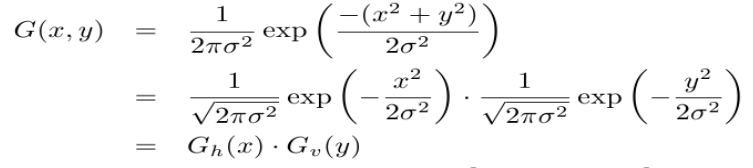

Además, visualizando la gráfica de la función gaussiana 2D, podemos apreciar que esta función toma el mismo valor si se evalúa sobre píxeles vecinos situados a la misma distancia del píxel central (donde se sitúa la parte más alta de la campana), es decir: píxeles equidistantes al centro tendrán asociado un mismo peso, lo que nos permite deducir que el kernel gaussiano 2D será simétrico, por lo que el resultado obtenido tras aplicar una convolución o una correlación cruzada será el mismo.


**<mark>Derivadas de la función gaussiana**

---

La función gaussiana 2D trabaja en un espacio bidimensional, por lo que a la hora de derivarla, tendremos que especificar en qué dirección deseamos derivar, ya sean en horizontal o vertical. De igual forma que la gaussiana 2D, sus derivadas de primer orden también son separables, pudiéndose expresar, en el caso de la horizontal, como el producto de la derivada de la gaussiana 1D evaluada sobre la componente 'x' (derivada gaussiana horizontal) por la gaussiana 1D evaluada en la componente 'y' (gaussiana vertical).

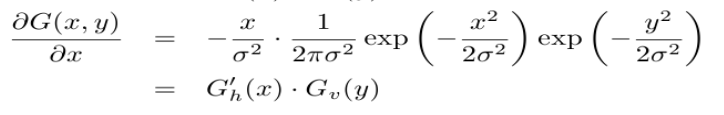

De igual forma, las derivadas de segundo orden también son separables.

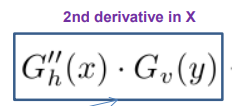

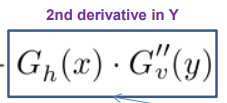

Las imágenes previas muestran la descomposición de la derivada de segundo orden sobre x y sobre y, respectivamente.

Convolucionar directamente una imagen con un kernel 2D separable es mucho más costoso que separar dicho kernel en dos kernels 1D, y convolucionar la imagen aplicando primero un kernel 1d, y luego el otro (en direcciones opuestas).

**<mark>Utilidad de la gaussiana y sus correspondientes derivadas**


---



Todo lo comentado hasta ahora ha sido información básica asociada a la gaussiana y sus derivadas de primer y segundo orden, pero no he explicado en concreto por qué nos interesa aplicar dichas funciones sobre nuestra imagen, es decir: ¿Con qué fin nos interesa convolucionar imágenes con kernels diseñados a partir de la gaussina o cualquiera de sus derivadas?

* **Gaussiana 2D**

  -  El kernel gaussiano tiene como objetivo suavizar una imagen, es decir, eliminar las altas frecuencias, dejando pasar únicamente las bajas. A este tipo de filtros se le suele denominar filtro pasa-bajos. Este comportamiento se logra debido al aspecto de la gaussiana, que asigna al píxel central de trabajo la media ponderada de todos los píxeles del vecindario de trabajo, incluyéndolo a él mismo, de forma que cuanto mayor sea la distancia a la que se sitúa un píxel vecino del central, menor será su peso, teniendo una menor influencia al calcular ese promedio.
  - Aplicar un kernel gaussiano suele dar mejores resultados que emplear un 'box' filter, kernel con  todos sus coeficientes similares (todos los píxeles vecinos influyen por igual en el promedio calculado, produciendo artefactos visuales en la imagen resultante). El kernel gaussiano, a diferencia de éste último, emplea una transición gradual entre los píxeles, logrando un desenfoque más natural.

* **Derivada de primer orden**

  * Hablemos primero de la derivada con respecto a 'x'. Visualizando su gráfica (imagen inferior) podemos deducir que se centra principalmente en los píxeles vecinos más cercanos situados en los laterales izquierdo y derecho del píxel central de trabajo, asignando pesos similares (hablando en términos absolutos) pero signos opuestos. Esto implica asignar al píxel central una media ponderada de la diferencia de intensidad entre los píxeles situados a ambos lados (izquierda y derecha), con una mayor influencia a mayor cercanía al píxel central. El comportamiento conseguido es realzar las zonas donde se producen cambios bruscos de intensidad en dirección **horizontal**, y que suelen reflejar texturas o bordes.
  * La derivada vertical (componente 'y') tiene un comportamiento similar a la derivada horizontal, buscando en este caso cambios bruscos de intensidad en dirección vertical.
  * Recalcar que la derivada de una función busca justo detectar máximos y minimos relativos de la función original (tomando los puntos donde la primera derivada se anula), calculando la velocidad de cambio en cada punto, para lo que es necesario únicamente conocer como varía la intensidad en un entorno pequeño de dicho píxel. Cuanto mayor sea el cambio de intensidad en dicho entorno (más brusco), mayor será el valor de la derivada en términos absolutos en dicho píxel(valor positivo muy grande o valor negativo muy grande), lo que reflejará la posibilidad de que dicho píxel pertenezca a un borde en la imagen. Por ende, derivar la gaussiana nos permitirá detectar los detalles más finos en una imagen.
* **Derivada de segundo orden**
  * Derivar dos veces una función equivale a derivar una vez su derivada, lo que nos permite detectar los máximos y mínimos relativos de su derivada (equivale tomar los puntos donde la segunda derivada se anula). Tal y como he comentado justo antes, un máximo relativo (igual para mínimo) en la primera derivada implica un punto donde se produce un cambio de intensidad muy rápido y brusco (posiblemente un borde). Por ende, la segunda derivada nos permite localizar, de igual forma que la primera derivada, los detalles más finos de una imagen, pero con una mayor precisión que la primera derivada.

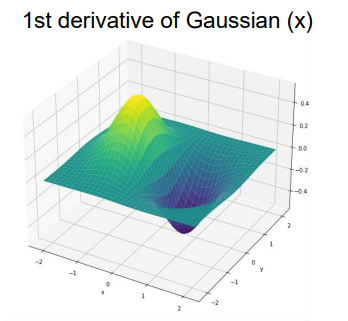

En resumen, para localizar los detalles más finos de una imagen, o bordes, podemos optar por cualquiera de los siguientes procedimientos:
* Buscar extremos relativos de la primera derivada
* Buscar ceros de la segunda derivada
* Buscar extremos relativos de la segunda derivada: A diferencia de los dos métodos previos (que devuelven puntos centrales del borde), este nos ofrece la posibilidad de detectar los límites del borde, es decir, los puntos que determinan el comienzo y final de un borde.

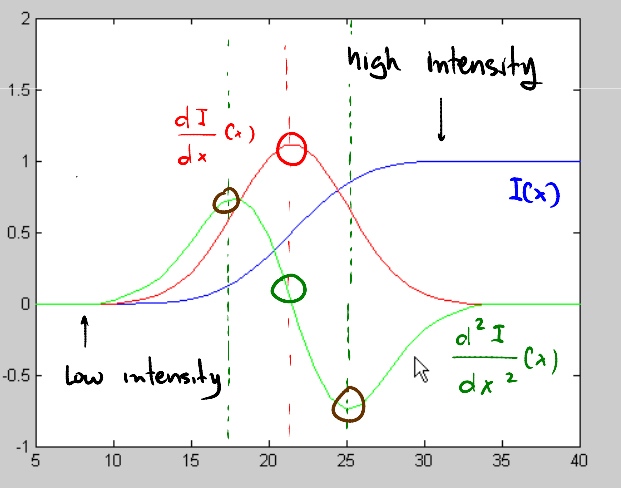

In [ ]:
def GaussFunc(x,sigma):
    return np.exp( -x**2 /(2*(sigma**2)) )

def GaussDeriv1Func(x,sigma):
    return (-x/(sigma**2))*GaussFunc(x,sigma)

def GaussDeriv2Func(x,sigma):
    return (x**2/(sigma**4) - 1/(sigma**2))*GaussFunc(x,sigma)

def gaussianMask1D(sigma=0, sizeMask=0, order=0, flag=False):
    # order = 0 -> función Gaussiana
    # order = 1 -> derivada de la Gaussiana
    # order = 2 -> derivada segunda de la Gaussiana

    #me deben de dar o sigma o el tamaño de mascara
    if sigma<=0 and sizeMask<=0:
      raise ValueError("Recuerde proporcionar el sigma o el tamaño de mascara")

    if sigma>0:
      #procedo a calcular el valor de k, que determinará a su vez el tamaño de kernel
      k=np.ceil(3*sigma)
      sizeMask=2*k+1
    else:
      #me dan el tamaño de máscara, necesito determinar el sigma
      #compruebo que el tamaño de kernel aportado sea un entero impar
      if((sizeMask+1)%2!=0):
        raise ValueError("Recuerde que el tamaño de mascara debe ser un entero impar")
      #tam_kernel = 2*k+1 --> k = (tam_kernel-1)/2
      k=(sizeMask-1)/2
      #min(k)>=3*sigma --> sigma=k/3
      sigma=round(k/3,2)

    #a partir de aquí, ya tengo fijado tanto mi sigma como el tamaño del kernel
    #defino el conjunto discreto donde evaluaré mi función gaussiana (de orden el indicado por parámetro)
    x=np.arange(-k,k+1)

    if(order==0):
      mascara=GaussFunc(x,sigma)
      #normalizo la mascara resultante
      mascara/= np.sum(mascara)
    elif(order==1):
      mascara=GaussDeriv1Func(x,sigma)
      mascara=mascara*sigma
    elif(order==2):
      mascara=GaussDeriv2Func(x,sigma)
      mascara=mascara*(sigma**2)
    else:
      raise ValueError("El valor de 'order' debe ser 0,1 o 2")

    if flag:
      return sizeMask,sigma,x,mascara
    else:
      return mascara

A la hora de calcular la máscara de la derivada de primer y segundo orden, es importante evitar dividir los coeficientes de dicho kernel entre la suma de todos ellos: no debemos normalizar los valores de la máscara. Esto se debe principalmente a la simetría que posteriormente veremos que presenta la primera derivada gaussiana 1D con respecto al eje horizontal, lo que hace que el área de la región que encierra al evaluarse sobre el conjunto de píxeles correspondiente sea un valor muy próximo a 0 (en este caso, al trabajar con la versión discreta, el área se corresponde con la suma de los coeficientes de la máscara). Si dividiésemos 1/suma de los coeficientes, daría un valor enorme, lo que haría disparar los pesos que definen la máscara de la primera derivada gaussiana 1D.

Situación análoga para la derivada de segundo orden.

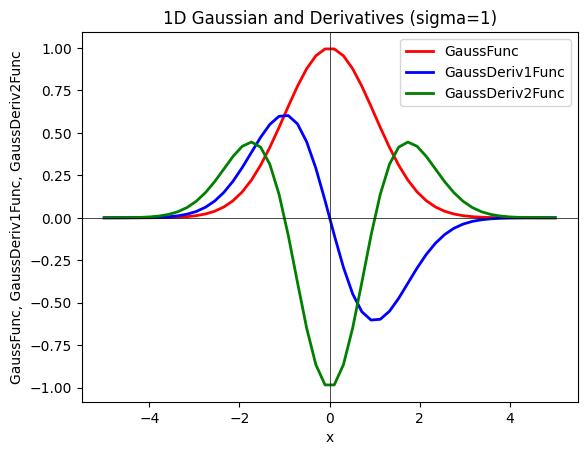

In [ ]:
# Con la siguiente figura verificamos que las funciones Gaussianas implementadas son correctas
plt.figure()
xvalues = np.linspace(-5, 5)
yvalues1 = GaussFunc(xvalues,1)
yvalues2 = GaussDeriv1Func(xvalues,1)
yvalues3 = GaussDeriv2Func(xvalues,1)
plt.plot(xvalues, yvalues1, lw=2, color='red',
label='GaussFunc')
plt.plot(xvalues, yvalues2, lw=2, color='blue',
label='GaussDeriv1Func')
plt.plot(xvalues, yvalues3, lw=2, color='green',
label='GaussDeriv2Func')
plt.title('1D Gaussian and Derivatives (sigma=1)')
plt.xlabel('x')
plt.ylabel('GaussFunc, GaussDeriv1Func, GaussDeriv2Func')
plt.axhline(0, lw=0.5, color='black')
plt.axvline(0, lw=0.5, color='black')
plt.legend();

* Debido a la simetría de la función gaussiana 1D respecto al eje Y, es clara que su derivada será simetrica con respecto al eje X.
* Debido a la simetría de la derivada con respecto al eje horizontal, la segunda derivada será simétrica con respecto al eje vertical

FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA


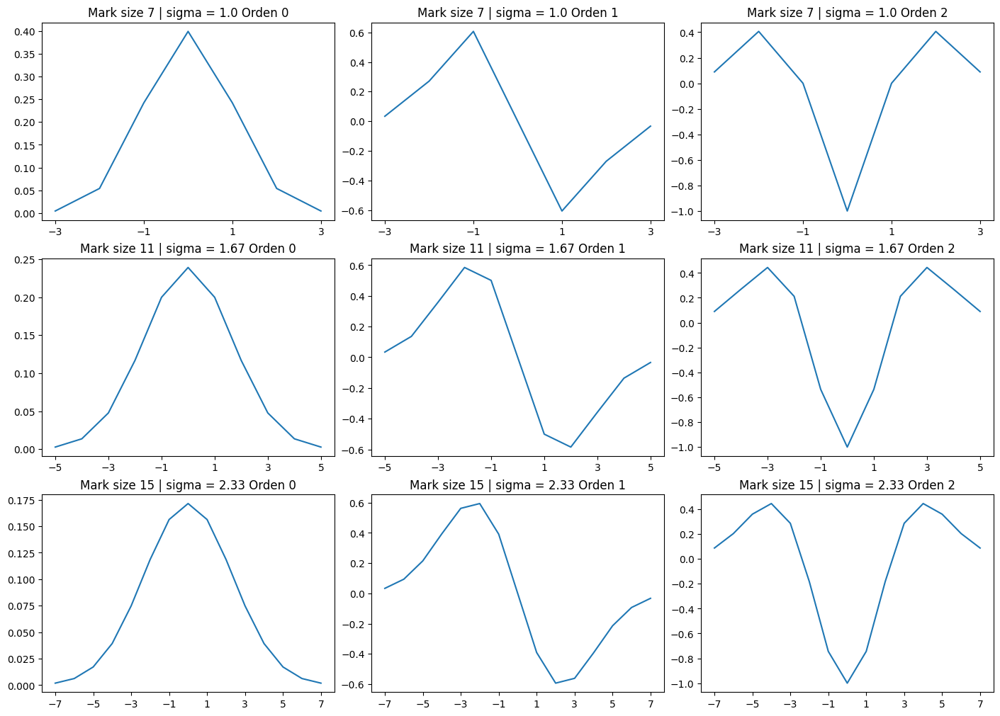

FIJAMOS AHORA EL SIGMA


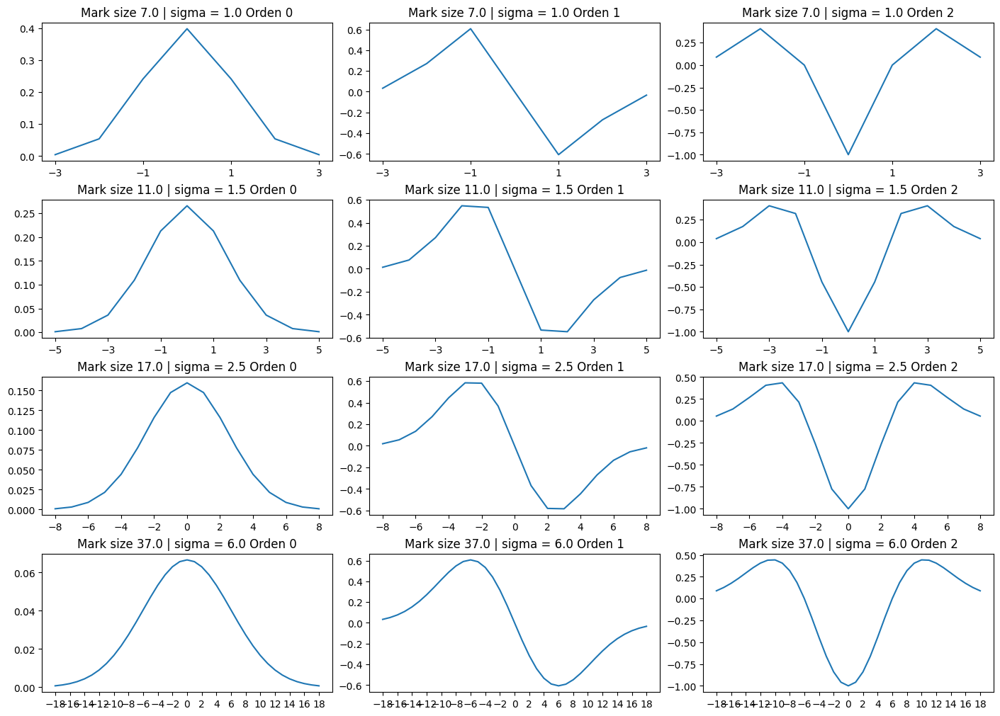

In [ ]:
sigma_values = [1.0,1.5,2.5,6.0]
size_masks = [7,11,15]

plt.rcParams["figure.figsize"] = (15,3) # para ajustar tamaño del ancho y alto (ejes)
print('FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA')
#comenzamos creando una figura de subgraficos (grid), especificando nº de filas y columnas, tamaño de la figura..., devolviendo la figura en sí y el conjunto de ejees para poder manipular cada subgrafico individualmente
fig, axs = plt.subplots(3, 3, figsize=(14,10), layout='constrained')
for row, sizeMask in enumerate(size_masks):
  for i in range(0,3):
    tam_kernel,sigma,x,y=gaussianMask1D(sizeMask=sizeMask, order=i, flag=True)
    axs[row,i].set_title(f'Mark size {sizeMask} | sigma = {sigma} Orden {i}')
    #etiquetamos los valores del eje X visibles en el grafico
    axs[row, i].set_xticks(np.arange(np.min(x),np.max(x)+1,2.0))
    axs[row,i].plot(x,y)

plt.show()



print('FIJAMOS AHORA EL SIGMA')
fig2, axs2 = plt.subplots(4, 3, figsize=(14,10), layout='constrained')
for row, sigma in enumerate(sigma_values):
  for i in range(0,3):
    tam_kernel,sigma,x,y=gaussianMask1D(sigma=sigma, order=i, flag=True)
    axs2[row,i].set_title(f'Mark size {tam_kernel} | sigma = {sigma} Orden {i}')
    #etiquetamos los valores del eje X visibles en el grafico
    axs2[row, i].set_xticks(np.arange(np.min(x),np.max(x)+1,2.0))
    axs2[row,i].plot(x,y)

plt.show()


A partir de dichas imágenes, podemos concluir que cuanto mayor es el tamaño de máscara que especificamos, mayor es el nº de píxeles empleados para cubrir casi la totalidad del área de la región encerrada por la gaussiana, mayor sigma, y por ende, la campana de Gauss tendrá mayor anchura y menor altura, ya que se tendrá que expandir a lo largo de un mayor trozo de su dominio para asegurar que el área encerrada sea 1. El dominio de valores sobre el que hemos estado empleando la función gaussiana ha sido un conjunto de píxeles, de tal forma que cuanto mayor sea dicho conjunto, más se expande la función para poder evaluarse desde el primer hasta el último píxel del conjunto. En resumen, un mayor tamaño de máscara o sigma implica una mayor potencia de suavizado (imagen más borrosa), ya que los píxeles vecinos más cercanos al central pierden peso o influencia sobre el promedio final, aumentando la influencia del resto de píxeles vecinos (distribución más uniforme de los pesos de los píxeles del vecindario).
Mismo razonamiento si indicamos en lugar del tamaño de máscara, el sigma.

En cuanto a la primera y segunda derivada, a mayor sigma (o mayor tamaño de máscara) mayor será la distancia de los picos o extremos relativos al centro, aunque manteniendo la misma amplitud.



## B) (1.5 puntos)

En este apartado se debe leer una imagen en escala de grises (`'zebra.jpg'`) y esta debe ser filtrada mostrando el resultado de la convolución con una Gaussiana, con la primera derivada de la Gaussiana (tanto en $X$ como en $Y$), y con la segunda derivada de la Gaussiana (tanto en $X$ como en $Y$). Para ello, hay que:
1. emplear los siguientes sigmas ($\{0.75,1,2,4,8, 16\}$),
2. usar la función de OpenCV `sepFilter2D()` con las máscaras calculadas a partir de las funciones desarrolladas en el apartado anterior,
3. mostrar todas las imágenes dentro del mismo canvas, tal y como se muestra más abajo,
4. analizar los resultados obtenidos y discutir si se corresponden con lo se esperaría obtener en base a nuestro conocimiento de la teoría.




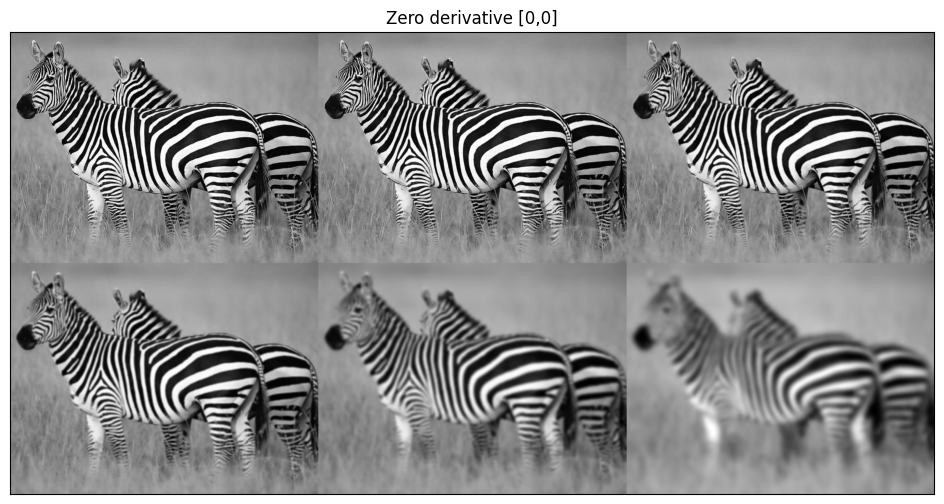

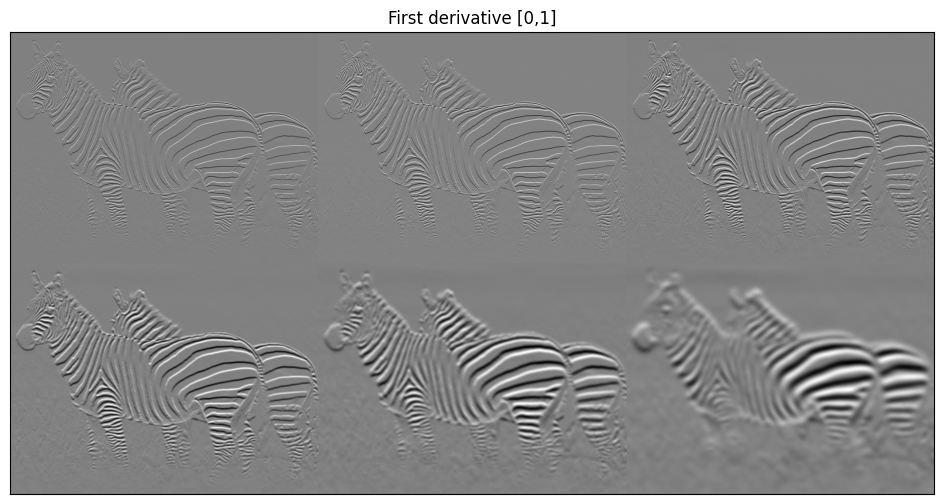

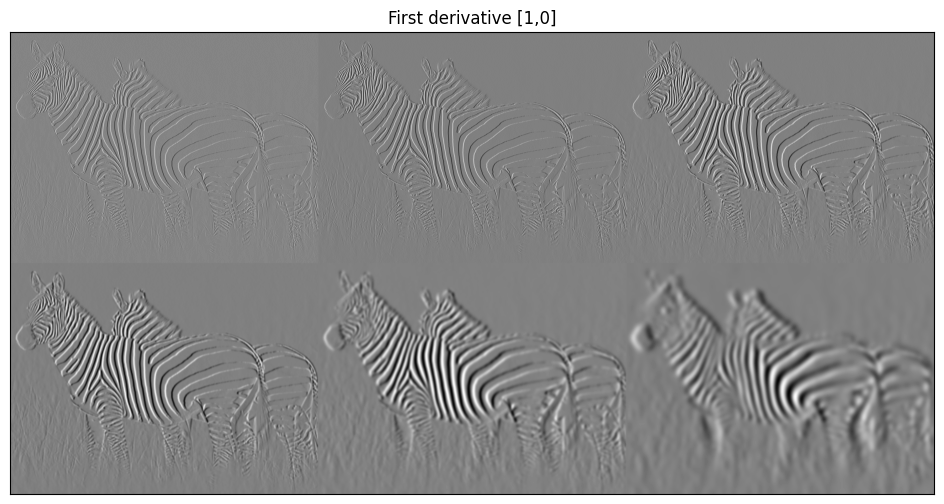

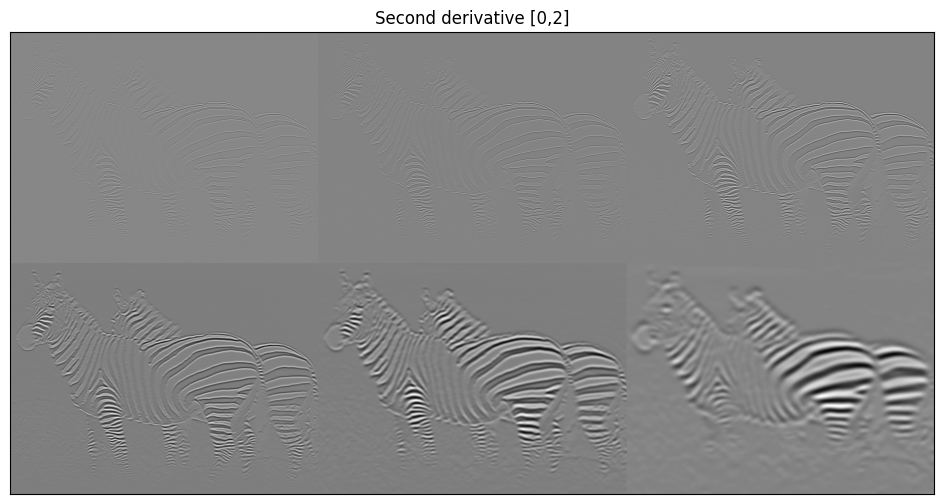

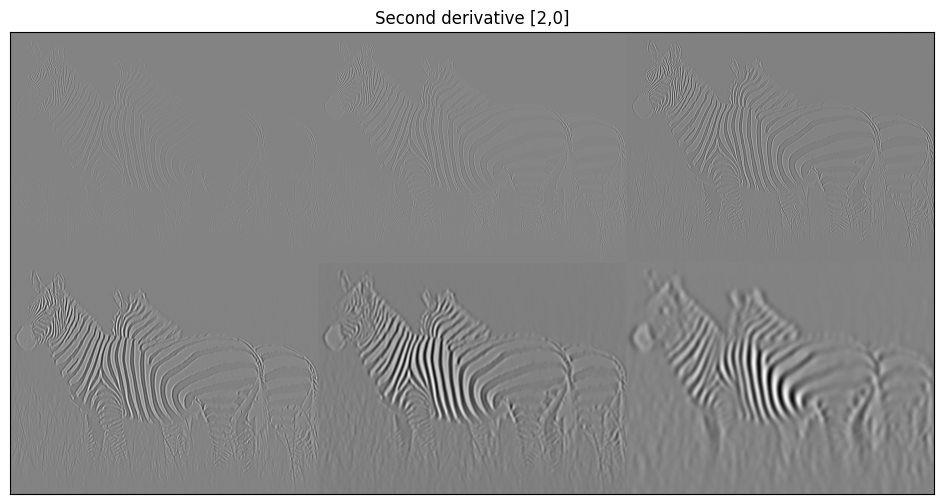

In [ ]:
def my2DConv(im, sigma, orders):
  if orders==[0,0]: # Suavizado Gaussiano
    return cv2.sepFilter2D(im,-1,gaussianMask1D(sigma),gaussianMask1D(sigma))
  elif orders==[1,0]: #Primera derivada gaussiana en 'x'
    return cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=1),kernelY=gaussianMask1D(sigma=sigma,order=0))
  elif orders==[0,1]: #Primera derivada gaussiana en 'y'
    return cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=0),kernelY=gaussianMask1D(sigma=sigma,order=1))
  elif orders==[2,0]: #Segunda derivada gaussiana horizontal ('x')
    return cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=2),kernelY=gaussianMask1D(sigma=sigma,order=0))
  elif orders==[0,2]: #Segunda derivada gaussiana vertical ('y')
    return cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=0),kernelY=gaussianMask1D(sigma=sigma,order=2))
  else:
    print('error in order of derivative')

sigmas = np.array([0.75,1,2,4,8,16])


im=cv2.imread(get_image('zebra.jpg'),0)

#defino primeramente los ordenes
lista_ordenes=[[0,0],[0,1],[1,0],[0,2],[2,0]]
titulos=['Zero derivative [0,0]','First derivative [0,1]','First derivative [1,0]','Second derivative [0,2]','Second derivative [2,0]']
#emparejo para asociar una descripción a cada derivada gaussiana del orden correspondiente
parejas=zip(lista_ordenes,titulos)
#defino los sigmas que quiero utilizar (lo que supondrá utiliar diferentes gaussianas de base)
sigmas=[0.75,1,2,4,8,16]

for ordenes,titulo in parejas:
  vim0=[]
  for sigma in sigmas:
    vim0.append(rangeDisplay01(my2DConv(im,sigma,ordenes),True))
  #tras guardar las imagenes que obtengo aplicando diferentes filtros gaussianos (diferentes sigmas) del orden fijado sobre la imagen original, las visualizo
  displayMI_ES(vim0,titulo,2)

Antes de nada, quiero comentar que la imagen resultante tras aplicar un kernel que trabaje con las derivadas de la gaussiana será de tipo 'float', por lo que para su visualización tendremos que normalizar los valores al rango [0,1]. Esto se debe al hecho de no normalizar la máscara de las derivadas, que estará conformada por pesos positivos y negativos, pudiendo generar un valor final negativo.

Además, quiero comentar algunos aspectos relevantes asociados a la derivada:
- La derivada es una convolución, y la convolución es asociativa, por lo que la derivada también verifica esa misma propiedad

  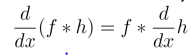

- La derivada es muy sensible al ruido que puede estar presente en una imagen, pudiendo detectar bordes donde no los hay, debido a la presencia de ese ruido, que se podría reflejar mediante píxeles blancos o negros aleatorios en un entorno del píxel de trabajo para el cual queremos calcular su derivada, encontrando cambios bruscos de intensidad donde realmente no los hay.

- A la hora de detectar bordes (utilizando la derivada) sobre una imagen que presenta ruido, podríamos comenzar suavizando la imagen para eliminar el ruido presente (utilizando por ej una gaussiana), y a posteriori, calcular la derivada. Esto supondría aplicar dos convoluciones (una para suavizar y otra para derivar). Sin embargo, aprovechando que la derivada es asociativa, podríamos aplicar la derivada sobre el kernel gaussiano, y el kernel resultante (derivada gaussiana) convolucionarlo con la imagen original. Esto implicaría emplear una única convolución sobre la imagen original usando la derivada de la gaussiana, ahorrándonos una convolución. En resumen, para detección de bordes sobre imágenes con ruido, procedemos a convolucionar con la derivada gaussiana (que se encarga tanto de detectar bordes como de hacer frente al ruido presente en la imagen original).



Comentemos los diferentes resultados obtenidos tras ir incrementando el valor del $\sigma$:
* Al aplicar el kernel gaussiano sobre la imagen original, se puede apreciar como, efectivamente, emplear un mayor $\sigma$ supone potenciar el efecto de suavizado, dando lugar a una imagen más y más borrosa, al eliminar una mayor cantidad de altas frecuencias.
* En el segundo conjunto de imágenes resultantes, estamos aplicando kernels de la primera derivada vertical gaussiana 2D. Recordemos que dicho kernel trabajaba principalmente en vertical, asignando un mismo peso pero con signo opuesto a aquellos píxeles situados por encima y por debajo del central, a la misma distancia del central, tal que cuanto más cercanos estuviesen del píxel central, mayor peso (el píxel central tiene peso 0). Básicamente, asocia al píxel de trabajo una media ponderada de la diferencia de intensidad entre los píxeles superiores e inferiores. Tal y como se puede apreciar en las fotos, las rayas horizontales de las cebras serán fácilmente visibles en la imagen resultante, ya que al tomar cualquier píxel situado en los límites de dicha raya, habrá un cambio brusco de intensidad (mirando en la dirección del eje Y), ya sea de blanco a negro, o viceversa, tal que:
    - Si se produce un cambio en vertical de blanco a negro, restaremos las intensidades de los píxeles superiores con las intensidades de los píxeles correspondientes inferiores (valor muy próximo a 255 - valor muy próximo a 0), dando lugar a un valor próximo a 255, por lo que el píxel central de trabajo se pintará de blanco.
    - Si se produce un cambio vertical de negro a blanco, el promedio de la diferencia de intensidades (superior - inferior) dará como resultado un valor negativo próximo a -255 (ya que estaremos restando 'intensidades muy bajas - intensidades muy altas'), asignando al píxel central de trabajo una intensidad muy baja, es decir, pintándolo de negro (ya que al normalizar, ese valor próximo a -255 pasará a ser 0: negro).

  Cualquier otro píxel de la imagen tendrá una intensidad resultante intermedia (un valor situado más o menos en la mitad del rango [0,255]), debido a que la imagen juega con grises muy similares entre sí, por lo que cada píxel tendrá un entorno donde las intensidades sean muy similares entre sí, haciendo que el promedio de las diferencias sea prácticamente 0. Como la imagen resultante juega en el rango [-255,255], al normalizar a [0,1], el 0 pasará a ser 0.5: gris semi-oscuro.

  Sin embargo, este kernel no permite detectar con claridad las rayas verticales, ya que al considerar un píxel situado en los límites de una raya vertical, todos los píxeles situados justo por encima o justo por abajo serán píxeles pertenecientes a esa misma raya de la cebra. Además, a la derecha tendremos altas intensidades, y a la izquierda, bajas intensidades (o viceversa), haciendo que el promedio de las diferencias verticales sean 0, que tras normalizar, pasará a tornarse de un gris semi-oscuro.

  Se puede apreciar que, conforme una raya vertical de la cebra se va curvando (es decir, tornándose más horizontal), más visible será esa parte concreta de la raya en la imagen resultante, por todo lo comentado previamente.

  Además, cuanto mayor es el valor de 'sigma' para el que definimos la derivada vertical gaussiana 2D, los extremos de la derivada gaussiana están más alejados del centro (manteniendo la altura), o lo que es lo mismo, los vecinos de mayor peso o influencia (en términos absolutos) están cada vez más alejados del centro, por lo que ocurriría lo siguiente:
    - Si tomo un píxel situado justamente por debajo del límite superior de una raya blanca horizontal, ese píxel ya no tendrá asociado un gris semi-oscuro, sino negro, ampliando la anchura del borde negro que visualizamos en la imagen resultante.
    - De igual forma, si tomo un píxel situado justamente por encima del límite inferior de la raya blanca horizontal, como los vecinos de mayor peso están más alejados, uno de ellos (el superior) estará en la raya blanca, y otro (el inferior en este caso) estará situado en la zona negra, por lo que se asignará finalmente un 'blanco' al píxel de trabajo, ampliando la anchura del borde blanco que visualizamos en la imagen final.

* En el tercer conjunto de imágenes hemos aplicado un kernel de la derivada horizontal gaussiana 2D, que, siguiendo el razonamiento opuesto al indicado en el anterior apartado, nos permitirá detectar con mayor claridad las rayas verticales frente a las horizontales. En cuanto a los efectos de incrementar el sigma, empleamos el mismo razonamiento que el indicado en la derivada vertical.
* En el caso de la segunda derivada vertical (4º conjunto de imágenes), nos permitirá detectar con mayor facilidad las rayas horizontales de la zebra (al igual que la primera derivada vertical). Recordemos que esto equivale a suavizar en horizontal, y luego aplicar la segunda derivada gaussinaa 1D en vertical. Este suavizado horizontal es importante para reducir el ruido presente en la dirección del eje X, centrándonos más en los cambios importantes de intensidad en la dirección vertical. La gráfica de ésta última nos hacía deducir que los pesos más grandes se asignan a vecinos cercanos (superior e inferior) y al propio píxel central, positivos y negativo, respectivamente, siendo el peso de este último prácticamente el doble de los dos vecinos más cercanos. Esto es, de froma muy aproximada, comparar la intensidad de los píxeles vecinos cercanos con respecto al del propio píxel central de trabajo (que cuenta x2). Por esta razón, se dan las siguientes situaciones (para un sigma pequeño):
  - Al emplear un sigma pequeño, los vecinos de mayor peso (descontando el píxel central) se sitúan muy cerca de dicho píxel, por lo que si consideramos un píxel situado en el centro de una raya (por ejemplo negra), el valor final asignado será equivalente, de forma aproximada, a sumar las intensidades de los píxeles vecinos superior e inferior de mayor peso (que entrarían dentro de la raya negra al estar tan próximos al píxel central) y restarles la intensídad del píxel de trabajo ( aprox 0+0-0 = 0), por lo que al normalizar a [0,1], pasaría a ser un gris semi-oscuro.
  Si tomásemos un píxel situado en el límite superior de la raya (por ej negra), ahora los vecinos más próximos por arriba y por abajo tendrán diferentes intensidades (ya que ambos se situarán en diferentes rayas de la cebra), por lo que el valor resultante será, aprox, 255+0-2x0 = 255, que al normalizar, se corresponde con 'blanco'. Igual si consideramos los píxeles del límite inferior de una raya negra.
  En el caso de tomar píxeles situados en los límites superior e inferior de una raya horizontal blanca, los dos vecinos de mayor peso serían píxeles negro y blanco respectivamente, el píxel central blanco, por lo que el valor resultante sería aproximadamente 255+0-2x255=-255, que al normalizar a [0,1] pasaría a ser negro. De ahí que los límites de las rayas horizontales blancas se tornen de negro.
  - Si aumentamos el sigma, los vecinos de mayor peso en la segunda derivada se sitúan más alejados del píxel central, por lo que ahora, los píxeles situados cerca de los límites de una raya horizontal tomarán el mismo nivel de gris que los píxeles que delimitan dicha raya. De ahí que conforme aumentamos el sigma, el interior de las rayas blancas y negras pasen a verse negras y blancas, respectivamente.

* El último conjunto de imágenes resulta de aplicar el kernel de la segunda derivada horizontal gaussiana 2D. Los efectos visuales se deben al razonamiento opuesto comentado para la segunda derivada vertical: en este caso, se resalta con mayor claridad el interior de las rayas verticales frente a las horizontales.

## C) (1 punto)

En este apartado hay que emplear la función de OpenCV `sepFilter2D()` con $\sigma=2.0$ para calcular y mostrar el gradiente (4 imágenes: derivada en $X$, derivada en $Y$, magnitud y orientación) y la Laplaciana de la Gaussiana. Se debe explicar el trabajo realizado, incluyendo las expresiones matemáticas subyacentes y el análisis, al igual que en todos los ejercicios, relativo a si los resultados obtenidos se corresponden con lo esperado.

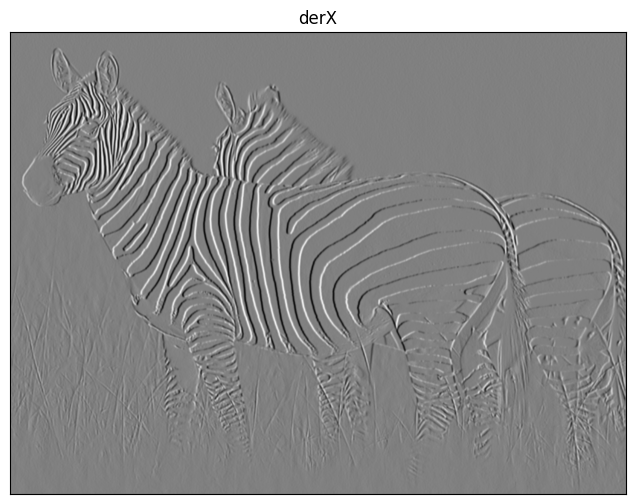

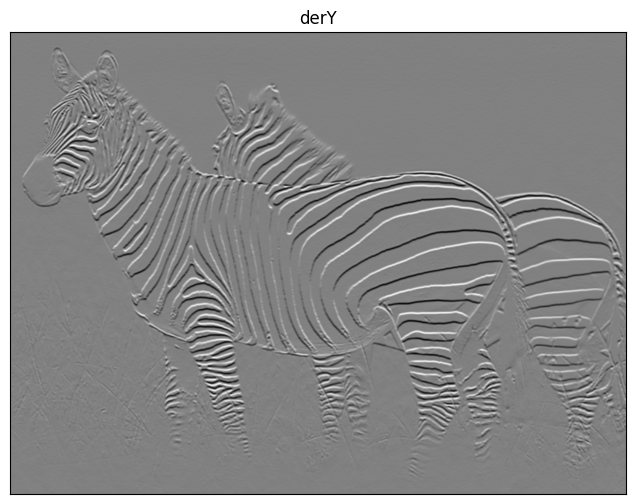

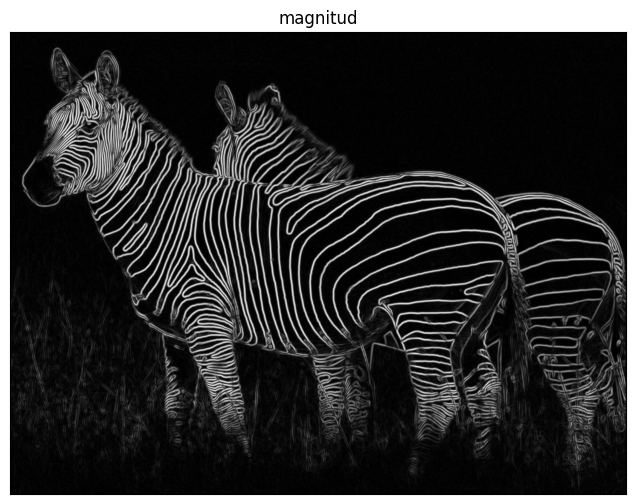

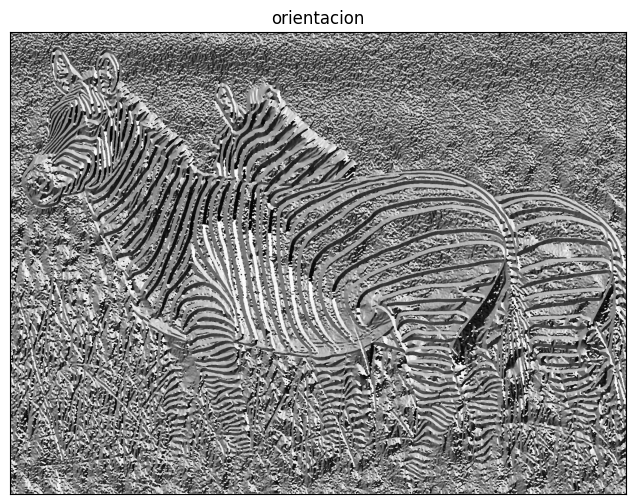

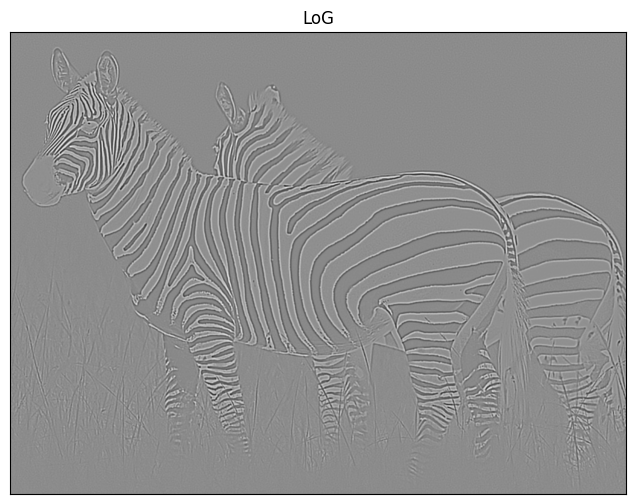

In [ ]:
def gradientIM(im,sigma):
  dx=cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=1),kernelY=gaussianMask1D(sigma=sigma,order=0))
  dy=cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=0),kernelY=gaussianMask1D(sigma=sigma,order=1))
  magnitud=np.sqrt(dx**2 + dy**2)
  orientacion=np.arctan2(dy, dx)
  return [dx,dy,magnitud,orientacion]

def laplacianG(im,sigma):
  #aplico segunda derivada horizontal de la gaussiana
  dxx=cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=2),kernelY=gaussianMask1D(sigma=sigma,order=0))
  #aplico segunda derivada vertical de la gaussiana 2d = producto de dos funciones 1d
  dyy=cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=0),kernelY=gaussianMask1D(sigma=sigma,order=2))
  return ((sigma**2)*(dxx+dyy))



titulos=['derX','derY','magnitud','orientacion']
imagenes_finales=gradientIM(im,2.0)
emparejado=zip(titulos,imagenes_finales)

for titulo, imagen_final in emparejado:
  displayIm(imagen_final,titulo)

#aplico ahora el operador Laplaciano-Gaussiano (LoG)
displayIm(laplacianG(im,2.0),'LoG')



Una imagen se puede ver como una discretización de la función intensidad (que inicialmente trabaja con un conjunto de puntos 2D continuo), ya que, como se ha comentado en repetidas ocasiones, el conjunto de píxeles de una imagen es un conjunto de puntos 2D discreto. Por esta razón, al querer calcular la derivada de la función intensidad en un punto, tendremos que definir una versión discreta de la derivada. En el caso de la derivada parcial con respecto a X (por ejemplo), podríamos optar por utilizar cualquiera de los procedimientos expuestos a continuación:
- Asignar la diferencia del píxel central y el siguiente (en dirección horizontal, claramente).
- Asignar la diferencia del píxel central y el anterior.
- Asignar la diferencia de intensidad entre los píxeles adyacentes al central.

Optamos por esa última al considerar los dos lados del píxel central como puntos de interés.

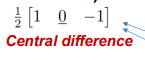

Recalcar que la constante de normalización no es necesaria, ya que lo que realmente nos importa es detectar diferencias.

Todo lo comentado anteriormente nos permite definir el gradiente de la función intensidad, magnitud del vector gradiente y dirección u orientación del gradiente.

En este ejercicio vamos a emplear el operador de Sobel, muy utilizado en procesamiento de imágenes para la detección de bordes, como ahora veremos.
Este operador emplea dos kernels 3x3 para calcular aproximaciones a las derivadas, uno para detectar cambios horizontales, y otro para cambios verticales.


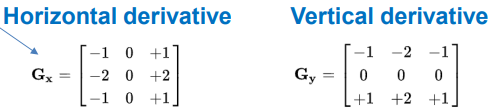

Las columnas (o filas) de ambas matrices son linealmente dependientes, condición suficiente para que sean separables.
* El operador de Sobel horizontal se puede separar como el producto de dos kernels 1D de 3 elementos cada uno de ellos.

  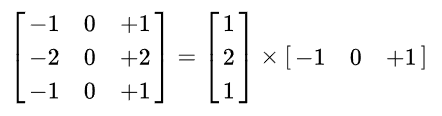

* El operador de Sobel vertical también se puede separar mediante el producto de los siguientes dos kernels 1D (uno vertical y otro horizontal):

    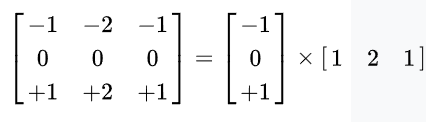
    



Visualizando los kernels que define el operador de Sobel (horizontal y vertical), se puede concluir que los resultados obtenidos difieren en función de si aplicamos una convolución o una correlación cruzada, ya que los kernels no son simétricos. Además, convolucionar una imagen usando el operador de Sobel horizontal será equivalente a aplicar una correlación cruzada sobre la imagen usando el operador de Sobel vertical. Para el caso de convolucionar con el operador vertical, misma situación. Esto se debe principalmente a que la traspuesta de un kernel coincide con el kernel que trabaja en la dirección opuesta (esta trasposición equivale a la rotación de 180º grados que aplicamos a la hora de convolucionar).

En cuanto al operador de Sobel horizontal:
- Analizando su descomposición en dos kernels 1D, se realiza un suavizado vertical seguido del cálculo de la derivada horizontal en el píxel de trabajo (empleando como aproximación a la derivada, la diferencia de intensidad entre píxeles adyacentes en el eje horizontal, comentado al inicio).  
- Como aproximación a dicho operador, emplearemos un suavizado gaussiano 1D vertical seguido de una derivada gaussiana 1D horizontal.

El procedimiento a seguir para el operador de Sobel vertical es similar a ése último comentado, por lo que no considero necesario comentarlo.

Los resultados obtenidos en la 1ª y 2ª imagen se corresponden con la convolución de la derivada en X y la derivada en Y, detalles ya especificados en el apartado b).

La tercera imagen se obtiene como resultado de aplicar la magnitud del gradiente. Recordemos que el vector gradiente en un punto tiene justamente como componentes la derivada horizontal y vertical sobre dicho punto, dando lugar a un vector que indica la dirección en la cual la función intensidad se incrementa más rápidamente. Su módulo representa cómo de rápido cambia la intensidad en un entorno del píxel central y en la dirección que marca el gradiente.

Los puntos situados en bordes tendrán asociados una derivadada horizontal o vertical muy grande (independientemente de que sea positivo o negativo), ya que habrá un cambio fuerte de intensidad en su vecindario, ya sea en la dirección X o Y. Por ende, el vector gradiente (derivada horizontal, derivada vertical) será un vector 2D con componentes grandes en términos absolutos, por lo que su módulo será grande. Además, el módulo del gradiente siempre devuelve valores mayores o iguales a 0.

Por este motivo, los píxeles que delimitan las rayas tendrán asociado un vector gradiente con módulo alto, equivalente a asociarle una intensidad alta (blanco).
Eel resto de píxeles tienen un vecindario donde la intensidad se mantiene más o menos estable, por lo que las componentes del vector gradiente (velocidad de cambio en eje X e Y) serán próximas a 0, haciendo que su módulo sea también próximo a 0, lo que será equivalente a asociar al píxel de trabajo el color 'negro'.

Pasamos a la orientación del vector gradiente: es justamente el ángulo de dicho vector, que apunta de la zona menos brillante a la más brillante. Si considero una raya vertical, los píxeles de ambos laterales tendrán asociado un vector gradiente de 0 y 180º grados, respectivamente. Por ejemplo:
- Si considero una raya vertical blanca (a la izquierda y a la derecha habrá negro), los píxeles del lateral izquierdo tendrán como vector gradiente un vector con orientación 0 grados (que pasará a ser blanco), mientras que los del lateral derecho tendrán un gradiente con orientación 180 grados (pasará a ser un gris intermedio en la escala de grises). Si considero una raya vertical negra, ocurre lo opuesto.

Sin embargo, si considero una raya horizontal, los vectores gradientes de los píxeles de los bordes tendrán orientación 90 grados o 270 grados, respectivamente. Por ejemplo:
- Si considero una raya horizontal blanca, los píxeles del límite superior tendrán asociado un vector gradiente con orientación 270 grado (negro), mientras que los del límite inferior, su vector gradiente tendrá orientación 90 grados (gris semi-oscuro).


En la última imagen hemos aplicado el operador Laplaciano-Gaussiano, resultante de combinar el operador laplaciano con el gaussiano. ¿A qué se debe esta combinación de operadores? ¿Por qué no aplicar directamente el operador Laplaciano?

El operador Laplaciano es un operador empleado en la detección de bordes. Se define como la suma de las derivadas de segundo orden de la función intensidad en X y en Y.

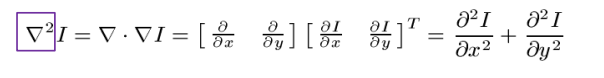


Sin embargo, tal y como he comentado en apartados anteriores, la derivada es muy sensible al ruido presente en la imagen, por lo que el operador Laplaciano será sensible al ruido. Para evitar esto, podríamos aplicar un operador low-pass, por ejemplo, un operador Gaussiano, que permite suavizar la imagen resultante tras aplicar el laplaciano. Como la derivada es una convolución, por tanto conmutativa y asociativa, todo este proceso será equivalente al siguiente:

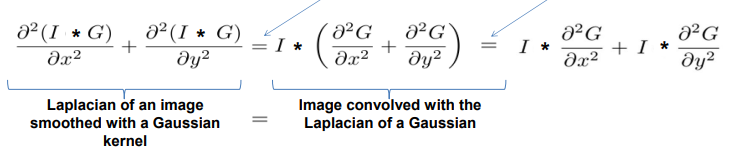

El proceso seguido es el siguiente:
1. Suavizar la suma de las derivadas es igual que sumar el suavizado de cada derivada.
2. Para cada sumando: suavizar la derivada (dos convoluciones conmutan) equivale a derivar el suavizado.
3. Obtenemos como resultado que combinar el operador laplaciano y gaussiano supone: sumar las derivadas de segundo orden (en x y en y) de la gaussiana.

Además, tal y como vimos en el apartado b), la derivada de segundo orden con respecto a 'x' nos permitía identificar con claridad los bordes verticales pero no los horizontales, Con la de segundo orden con respecto a Y, ocurría lo contrario. Por ende, sumando ambas derivadas, conseguimos eliminar el problema que aparecía al trabajar con cada una de ellas de forma independiente, ya que dicha suma implica considerar, no sólo la tasa de cambio horizontal, sino también vertical, pudiendo identificar con claridad tanto rayas horizontales como verticales.

## D) (1.5 puntos)

Implemente una función para realizar "a mano" la convolución separable (es decir, empleando kernels 1D). Dicha función debe recibir como entrada una imagen (con el _padding_ adecuado, en caso de que lo necesite, ya incorporado) y un kernel 1D, y debe proporcionar como salida la imagen convolucionada con el kernel en ambas direcciones.

Una vez haya implementado la función, realice el suavizado de la imagen `motorcycle.bmp` (usando un _Gaussian kernel size_ de 7, y dejando que sea la propia función de creación del kernel la que determine el $\sigma$ adecuado), y compare el resultado con el de `cv2.GaussianBlur` (en donde se debe optar por la misma estrategia: fijando $ksize=7$ y dejando que sea la propia función de OpenCV la que escoja el sigma). ¿Hay diferencias (sea a nivel de resultado final o de tiempo de ejecución)? En caso afirmativo, ¿a qué se pueden deber?

In [ ]:
def convolve1D(image,kernel):
    #presuponemos que la imagen tiene ya añadido el padding correspondiente
    #primero tomamos las dimensiones de la imagen y definimos con ceros la imagen resultante
    altura,anchura=image.shape
    output=np.zeros_like(image)
    #luego tomamos el grosor del padding de la imagen
    grosor_padding=int((kernel.size-1)/2)
    #rotamos el kernel ya que aplicamos convolucion
    kernel=kernel[::-1]
    for i in range(grosor_padding,altura-grosor_padding):
      for j in range(grosor_padding,anchura-grosor_padding):
        ventana=image[i,j-grosor_padding:j+grosor_padding+1]
        output[i,j]=np.sum(ventana*kernel)
    return output

#presuponemos que kx y ky son del mismo tamaño, y que son arrays unidimensionales o listas
def convolve2D(image, kx, ky):
    #calculamos el padding que es necesario añadir a la imagen
    grosor_padding=int((kx.size-1)/2)
    #añadimos el padding a la imagen
    imagen_con_padding=np.pad(image,(grosor_padding,grosor_padding),mode='constant', constant_values=0)
    #aplicamos convolucion sobre la imagen usando el kernel horizontal 'kx'
    salida_1=convolve1D(imagen_con_padding,kx)
    #aplicamos convolucion sobre la nueva imagen obtenida, usando ahora el kernel vertical
    #esto equivale a convolucionar la traspuesta de dicha imagen trabajando en horizontal con dicho kernel, y el resultado trasponerlo de nuevo
    salida_2=convolve1D(salida_1.T,ky).T
    #antes de devolver la imagen final, le quitamos el padding añadido inicialmente para aplicar la convolución
    return salida_2[grosor_padding:-grosor_padding,grosor_padding:-grosor_padding]

A la hora de implementar 'a mano' la convolución 2D separable he tenido en cuenta los siguientes aspectos:
* Los dos kernels 1D tienen el mismo tamaño
* Convolucionar una imagen con un kernel 1D vertical es equivalente a trasponer la imagen, convolucionarla con ese mismo kernel pero en horizontal, y la imagen resultante volver a trasponerla.

El proceso que he aplicado supone seguir, en orden, los siguientes pasos:
1. Comenzamos calculando el padding que es necesario añadir a mi imagen de entrada a partir del tamaño de cualquiera de los dos kernels 1D (ya que ambos tienen mismo tamaño).
2. Convoluciono la imagen (con padding ya añadido) usando el kernel 1D horizontal: 'convolve1D'
3. Convoluciono la imagen resultante usando el kernel 1D vertical. En mi caso, esto supone convolucionar la traspuesta de la imagen resultante tras el paso 2) con ese kernel 1D vertical, pero aplicado en este caso en horizontal, usando 'convolve1D'.
4. Traspongo la imagen obtenida tras el anterior paso y la devuelvo, quitándole antes de nada el padding añadido al comienzo.

Sin embargo, analizando un poco todo con más detalle, me di cuenta de una pequeña optimización que podría llevar a cabo: cada vez que aplique una convolución usando un kernel 1D, podría extenderlo o replicarlo tantas filas como tenga la imagen original sin el padding, y a posteriori, aplicarlo a la magen recorriendo únicamente las columnas. Todo esto reduciría el nº de bucles 'for' a utilizar a 1. Es decir:
- En cada iteración, fijo una columna
- Tomo el nuevo kernel, ahora 2D (tras generar réplicas por filas), tomo la submatriz de la imagen formada por todas las filas de la imagen sin padding y centrada en la columna correspondiente, y multiplico por filas, modificando de golpe todos los valores de la columan fija.
- Siguiente iteración, hasta alcanzar la última columna de la imagen original sin contar el padding.

In [ ]:
#esta funcion se encarga de convolucionar la imagen (con padding ya añadido) usando un kernel horizontal
def convolve1D_optimizada(image,kernel):
    #presuponemos que la imagen tiene ya añadido el padding correspondiente
    #primero tomamos las dimensiones de la imagen y definimos con ceros la imagen resultante
    altura,anchura=image.shape
    output=np.zeros_like(image)
    #luego tomamos el grosor del padding de la imagen
    grosor_padding=int((kernel.size-1)/2)
    #rotamos el kernel ya que aplicamos convolucion
    kernel=kernel[::-1]
    #lo extiendo en vertical (replico en filas) con tantas filas como tenga la imagen sin el padding
    filas_sin_padding=image.shape[0]-2*grosor_padding
    kernel_extendido = np.tile(kernel,(filas_sin_padding,1))
    for columna in range(grosor_padding,anchura-grosor_padding):
      ventana=image[grosor_padding:-grosor_padding,columna-grosor_padding:columna+grosor_padding+1]
      #tengo la submatriz tomada, aplico coloco el kernel extendido y tras hacer el producto del elemento de la ventana con el elemento correspondiente del kernel,
      #sumo fila a fila y añado a la matriz final
      valores_finales=np.sum(ventana*kernel_extendido,axis=1)
      output[grosor_padding:-grosor_padding,columna]=valores_finales
    return output

#presuponemos que kx y ky son del mismo tamaño, y que son arrays unidimensionales o listas
def convolve2D_optimizada(image, kx, ky):
    #calculamos el padding que es necesario añadir a la imagen
    grosor_padding=int((kx.size-1)/2)
    #añadimos el padding a la imagen
    imagen_con_padding=np.pad(image,(grosor_padding,grosor_padding),mode='constant', constant_values=0)
    #aplicamos convolucion sobre la imagen usando el kernel horizontal 'kx'
    salida_1=convolve1D_optimizada(imagen_con_padding,kx)
    #aplicamos convolucion sobre la nueva imagen obtenida, usando ahora el kernel vertical
    #esto equivale a convolucionar la traspuesta de dicha imagen trabajando en horizontal con dicho kernel, y el resultado trasponerlo de nuevo
    salida_2=convolve1D_optimizada(salida_1.T,ky).T
    #antes de devolver la imagen final, le quitamos el padding añadido inicialmente para aplicar la convolución
    return salida_2[grosor_padding:-grosor_padding,grosor_padding:-grosor_padding]

In [ ]:
import time

filename = 'motorcycle.bmp'
#leemos la imagen en escala de grises
im=cv2.imread(get_image(filename),0)

#suavizamos manualmente
inicio=time.time()
im1=convolve2D(im,gaussianMask1D(sizeMask=7),gaussianMask1D(sizeMask=7))
fin=time.time()
tiempo1=fin-inicio

inicio=time.time()
im1=convolve2D_optimizada(im,gaussianMask1D(sizeMask=7),gaussianMask1D(sizeMask=7))
fin=time.time()
tiempo2=fin-inicio

#suavizamos usando OpenCV
inicio=time.time()
im2=cv2.GaussianBlur(im, (7, 7), 0)
fin=time.time()
tiempo3=fin-inicio

print(f'Tiempo de ejecución de la convolución manual SIN optimizar: {tiempo1:.4f} segundos')
print(f'Tiempo de ejecución de la convolución manual optimizada: {tiempo2:.4f} segundos')
print(f'Tiempo de ejecución de la convolución de OpenCV: {tiempo3:.4f} segundos')

Tiempo de ejecución de la convolución manual SIN optimizar: 2.2911 segundos
Tiempo de ejecución de la convolución manual optimizada: 0.0242 segundos
Tiempo de ejecución de la convolución de OpenCV: 0.0204 segundos


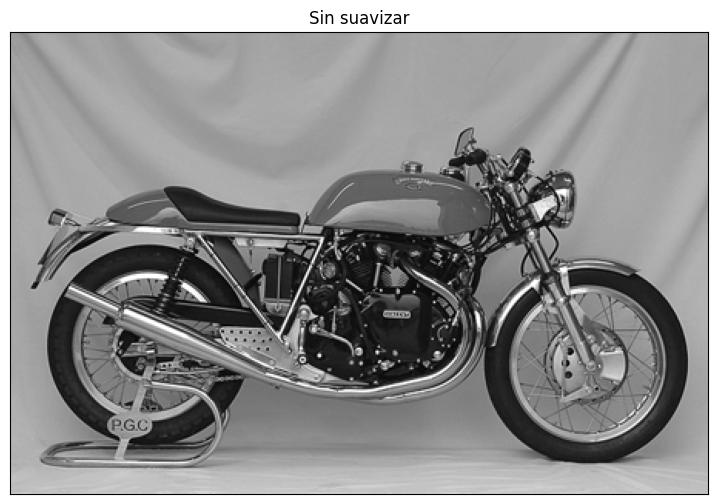

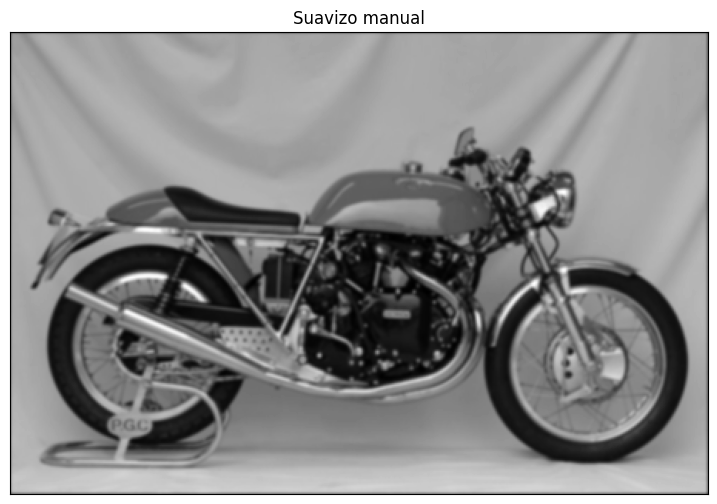

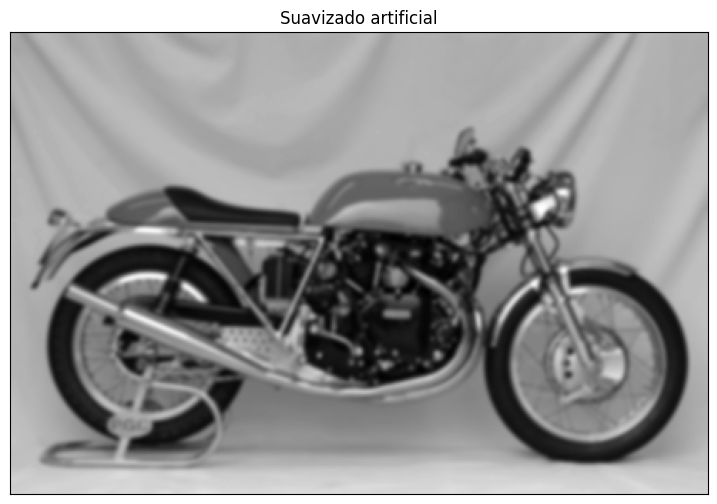

In [ ]:
displayIm(im,'Sin suavizar')
displayIm(im1,'Suavizo manual')
displayIm(im2,'Suavizado artificial')

Tras visualizar los tiempos de ejecución y los resultados obtenidos con la convolución manual diseñada y la proporcionada por OpenCV, podemos sacar las siguientes conclusiones:
- OpenCV se centra en la eficiencia, no en la precisión. Esto justifica el escaso tiempo de ejecución del suavizado gaussiano usando OpenCV, en comparación al que implementé manualmente.
- En cuanto a las imagenes obtenidas, puedo apreciar que la convolución 2D manual implementada logra unos resultados algo mejores que los que nos proporciona la función de OpenCV, a pesar de que requiera un mayor tiempo de cómputo.

## E) (0.5 puntos)

Las herramientas de IA generativa son de gran utilidad tanto para estudiantes como para docentes. No obstante, resulta fundamental tener una actitud crítica y asumir desde el principio que las respuestas proporcionadas por estas herramientas pueden ser factualmente incorrectas (véase,  por ejemplo, https://elpais.com/tecnologia/2024-09-25/los-nuevos-modelos-de-ia-como-chatgpt-persiguen-la-superinteligencia-pero-no-logran-ser-fiables-ni-en-preguntas-bobas.html). En este sentido, vale la pena recordar lo que indica la guía de la UGR (https://ceprud.ugr.es/formacion-tic/inteligencia-artificial): _"Debes revisar siempre la salida que genera y las posibles referencias que utilice. [...] Mejora tus resultados con la IAGen aprendiendo a usarla y a comunicarte con ella de manera adecuada. Pero no dejes que piense por ti."_

En este apartado trabajaremos de forma crítica la utilidad de estas herramientas. Para ello, el alumnado debe emplear ChatGPT (https://chatgpt.com/) para consultar _"en qué consiste y para qué sirve la normalización de escala, así como por qué, en dicha normalización de escala, se multiplica por $\sigma^n$, siendo $n$ el orden de derivada"_. No se trata meramente de copiar lo que indique ChatGPT como salida, sino de analizar y matizar su respuesta, confrontándola con otras lecturas y lo que el estudiante sabe de la teoría, indicando en qué aspectos dicha respuesta puede considerarse correcta y en qué aspectos quizás no lo es.

He comenzado preguntando a ChatGPT lo indicado, aportándome la siguiente respuesta (resumida):

La normalización de escala es una técnica que ajusta las respuestas de los filtros gaussianos o de sus derivadas para que sus resultados sean comparables entre diferentes escalas. Consiste en modificar la fórmula de la derivada para incluir un factor de normalización que compense la disminución de la amplitud cuando se trabaja a escalas mayores (
𝜎 grandes).
El factor de normalización utilizado en la derivada de la gaussiana es
$\sigma^n$, siendo $n$ el orden de la derivada

Además de todo esto, también me indica que valores de $\sigma$ pequeños me permiten detectar detalles finos, mientras que valores más grandes son útiles para detalles gruesos.

A pesar de que la información proporcionada por ChatGPT sea correcta, me gustaría entrar más en detalle acerca del proceso de normalización de escala:

Recordando la expresión de la derivada de la Gaussiana 2D con respecto a **x**, en el caso de fijar las coordenadas del píxel sobre el que aplicar la derivada gaussiana y considerar únicamente como variable el sigma, tendrá lugar la siguiente situación:

Si aumentamos el sigma, el valor devuelto por la derivada será menor, o lo que es equivalente, menor será el peso asignado a dicho píxel.
Este aumento del sigma supone una campana de Gauss más ancha, implicando una mayor distribución de los pesos de los píxeles del vecindario, y por ende, su derivada tendrá una menor amplitud (picos no tan prominentes), es decir: los píxeles vecinos más próximos al central no serán tan predominantes sobre el resto de vecinos, por lo que el valor final del píxel central no dependerá principalmente del cambio de intensidad de dichos píxeles más próximos (importante recordar que los picos de la derivada se sitúan sobre los píxeles vecinos más cercanos al central)
En resumen, un aumento del sigma supondrá una pérdida de sensibilidad a cambios bruscos de intensidad en píxeles cercanos, llegando a la siguiente conclusión:
1. Valores pequeños de sigma permiten que la derivada capture detalles finos, cambios bruscos de intensidad en píxeles muy próximos (bordes nítidos).
2. Valores grandes de sigman permiten que la derivada capture detalles más gruesos, detectando zonas más amplias de la iamgen donde se produce un cambio de intensidad gradual (bordes difusos), ya que no se centra principalmente en el cambio de intensidad de los píxeles más próximos, sino también en el resto, perdiendo la capacidad de detectar bordes nítidos.

El procedimiento de multiplicar la máscara de la derivada por $\sigma^n$ permite reducir esa pérdida de amplitud de la derivada conforme incrementamos dicho parámetro, mejorando la detección de detalles finos.
En el caso de la segunda derivada, el factor de normalización es $\sigma^2$ ya que la amplitud de la respuesta disminuye más drásticamente a medida que sigma aumenta.



# **Ejercicio 2**:  Pirámides Gaussianas y Laplacianas (3.5 puntos)







## A) (1.5 puntos)

Construya una pirámide Gaussiana de 4 niveles empleando máscaras Gaussianas de tamaño $7\times7$. No se permite emplear las funciones `pyrUp()` y `pyrDown()` de OpenCV, ni tampoco `cv2.resize()`.

In [ ]:
'''
This function displays a pyramid of images, providing as input the list of images to display.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1, cv2.resize(im1,(im1.shape[0]//2,im1.shape[1]//2),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//4,im1.shape[1]//4),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//8,im1.shape[1]//8),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//16,im1.shape[1]//16),cv2.INTER_LINEAR)]

displayPyramid(images, title='Piramide de Manzanas')

'''
def displayPyramid(vim, title='result'):
  temp = np.zeros_like(vim[0])
  if np.mod(temp.shape[1],2)==0:
    h = temp[:, :temp.shape[1]//2]
  else:
    h = temp[:, :(temp.shape[1]//2)+1]
  out = np.hstack((temp, h))
  top = 0
  out[0:vim[0].shape[0], 0:vim[0].shape[1]] = vim[0]
  left = vim[0].shape[1]
  for i in range(1, len(vim)):
    out[top:top+vim[i].shape[0], left:left + vim[i].shape[1]] = vim[i]
    top += vim[i].shape[0]
  displayIm(out, title)

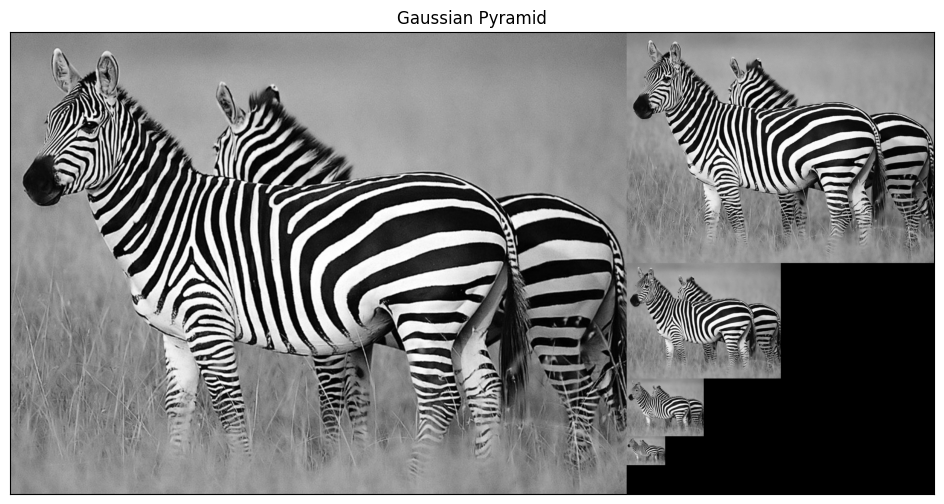

In [ ]:
def pyramidGauss(im,sizeMask=7, nlevel=4,suavizar=True):
  pyramid = []
  #añadimos la imagen inicial
  pyramid.append(im)
  for i in range(nlevel):
    if suavizar:
      #suavizamos la imagen empleando kernel gaussiano del tamaño indicado
      im=cv2.sepFilter2D(im,ddepth=-1,kernelX=gaussianMask1D(sizeMask=sizeMask),kernelY=gaussianMask1D(sizeMask=sizeMask))
    #downsampling: reducimos la resolución a la mitad
    im=im[::2,::2]
    pyramid.append(im)
  return pyramid

im=cv2.imread(get_image('zebra.jpg'),0)
#print("Tipo de dato de la imagen:", im.dtype)
pyrG = pyramidGauss(im,sizeMask=7, nlevel=4)
displayPyramid(pyrG,'Gaussian Pyramid')


La pirámide Gaussiana nos es útil para disponer de una misma imagen en diferentes escalas, empleando una u otra en función de los que nos interese más en cada momento. Partimos de la base de la pirámide, donde se sitúa la imagen original, y subimos tantos niveles como especificamos para dicha pirámide, tal que cuanto mayor sea el nivel, menor será la escala o resolución de la imagen. El proceso de construcción es muy sencillo: partiendo de la imagen original, suavizamos y redimensionamos eliminando la mitad de filas y columnas, es decir: la imagen situada en el siguiente nivel tendrá una resolución equivalente a una cuarta parte de la anterior. Repetimos el proceso hasta llegar al pico de la pirámide (último nivel).

Pero claro, en ese proceso de redimensionar la imagen una y otra vez, ¿por qué es necesario suavizar antes de reducir su resolución? Simplemente para evitar el 'aliasing':
- Una imagen es una función que asocia a cada píxel una intensidad. Por tanto, y según lo que nos dice Fourier (cualquier señal se puede expresar como la suma de funciones sinusoidales), podemos aplicar la transformada de Fourier y expresar esa señal (función intensidad de la imagen) como suma de frecuencias sinusoidales altas y bajas que viven en el espacio de frecuencias, cada una de ellas definidas a partir de su frecuencia (nº de ciclos o repeticiones por unidad de tiempo) y amplitud.
- Cuando tenemos una señal continua, podemos tomar un muestreo sobre ella, es decir: seleccionar ciertos valores de esa señal continua con el fin de obtener una discreta.

  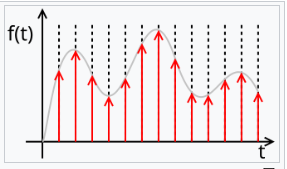

Sin embargo, en función de la frecuencia de muestreo, seremos capaces o no de reconstruir correctamente la señal continua original a partir de la discreta (obtenida tras realizar un muestreo sobre la señal continua). En otras palabras, la frecuencia de muestreo representa la cantidad de detalles que vamos a preservar de la señal original, y en función de si hemos tomado los suficientes detalles (o muestras), seremos capaces de reconstruir la señal original sin problemas.

En efecto, el aliasing hace referencia a aquellas situaciones en las que la frecuencia de muestreo no es lo suficientemente alta como para ser capaces de reconstruir la imagen original: no se guardan los suficientes detalles.
Esto podría ocasionar que la señal reconstruida a partir de las muestras tomadas tenga una frecuencia mucho más baja de la que tiene realmente, produciendo una señal errónea.

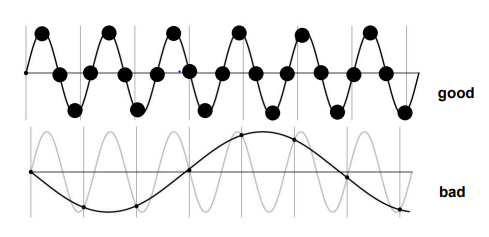

Para evitar el aliasing, podemos seguir estos dos pasos:
* Tomar muestras con mayor frecuencia: el teorema de muestreo de Nyquist nos recomienda tomar, al menos, dos muestras por ciclo.
* Eliminar las altas frecuencias de la imagen: podemos eliminar el ruido presente en la imagen empleando un filtro pase-bajos (suavizar).

A la hora de diseñar la pirámide Gaussiana, reducir la resolución de la imagen implica, usando su transformada de Fourier, tomar muestras de las diferentes señales o frecuencias que componen la imagen (en el espacio de frecuencias), reconstruir las señales continuas a partir de las muestras tomadas de cada una de ellas, y aplicar la inversa de la transformada de Fourier, pasando del espacio frecuencia al espacio tiempo, es decir, devolviendo la imagen reconstruida. Claramente, cuanto mayor sea la cantidad de frecuencias altas de la imagen, mayor relevancia tendrá la frecuencia de muestreo que tomemos para evitar el aliasing, ya que frecuencias más altas requieren una mayor tasa de muestreo, si queremos evitar dicho aliasing (más cantidad de frecuencias altas implica mayor riesgo de sufrir aliasing). Por ende, optamos por suavizar la imagen antes de reducir su resolución, eliminando altas frecuencias y haciendo frente, por tanto, al aliasing, ya que eliminar altas frecuencias implica eliminar detalles de la imagen original, y por ende, será necesario retener una menor cantidad de información que nos permita reconstruir en cualquier momento la imagen original.

Nota: la imagen situada en un determinado nivel de la pirámide gaussiana tiene una cuarta parte la resolución de la imagen situada en el nivel justamente inferior (resolución = num_filas x num_columnas, y reducimos a la mitad el nº de filas y columnas)

## B) (1 punto)

Use su código del apartado anterior para implementar una función que permita construir una pirámide Laplaciana de 4 niveles.

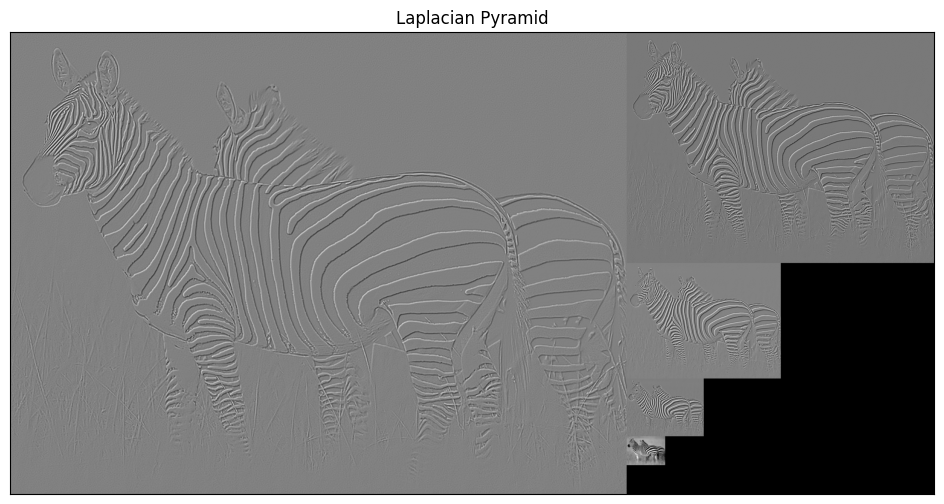

In [ ]:
def pyramidLap(im, sizeMask,nlevel=4,suavizar=True,flagInterp=cv2.INTER_LINEAR):
  pir_lap=[]
  #construyo la piramide gaussiana
  pir_gauss=pyramidGauss(im,sizeMask,nlevel,suavizar)
  #las imagenes de la piramide gaussiana son de tipo uint8, al hacer 'resize' de una de ellas y restarla con la imagen de la pir.gaussiana correspondiente, estaremos restando dos imagenes de tipo uint8 (entero sin signo de 0 a 255). Sin embargo,
  #esa diferencia puede producir valores negativos, mas especificamente, en [-255,255], pero al estar trabajando con 'uint8', los negativos se saturarán al 0. Para evitar esto, convertimos las imagenes de la piramide gaussiana a un tipo de dato
  #de mayor capacidad que permita representar valores negativos
  pir_gauss=[im.astype(np.float32) for im in pir_gauss]

  for i in range(nlevel):
    im_expandida=cv2.resize(pir_gauss[i+1],(pir_gauss[i].shape[1],pir_gauss[i].shape[0]),interpolation=flagInterp)
    resultado=pir_gauss[i]-im_expandida
    #almaceno la imagen resultante de tipo float. Se normalizarán justo a la hora de visualizar dichas imagenes
    pir_lap.append(resultado)


  #añado la imagen situada en el ultimo nivel de la piramide gaussiana
  pir_lap.append(pir_gauss[nlevel])
  return pir_lap


im=cv2.imread(get_image('zebra.jpg'),0)
pyrL = pyramidLap(im,sizeMask=7)
# antes de visualizar las imagenes de la piramide laplaciana, las normalizo para que trabajen dentro del rango [0,1]
pyrL = [rangeDisplay01(image) for image in pyrL]
displayPyramid(pyrL,'Laplacian Pyramid')

La pirámide Laplaciana tiene principalmente como objetivo preservar la imagen original a muy poca resolución, y disponer de las altas frecuencias (zonas detalladas) a diferentes escalas.
Su construcción requiere de la pirámide gaussiana, siguiendo los siguientes pasos:
1. Comenzamos desde la imagen más pequeña de la pirámide Gaussiana (desde el pico de la pirámide).
2. Expandimos la imagen a la misma resolución de la imagen de la pirámide gaussiana del nivel justamente inferior, y calculamos su diferencia con esta última. Esta diferencia supone eliminar las bajas frecuencias (que conforman la imagen expandida) de la imagen situada en el nivel correspondiente de la pirámide Gaussiana (equivalente a aplicar un high-pass filter), dando como resultando la imagen con las altas frecuencias, siendo almacenada en la pirámide Laplaciana.

En el caso de querer construir la pirámide laplaciana, la imagen inicial se expande a una imagen resultante con una resolución que equivale a 4 veces la resolución de la imagen inicial, equivalente a hacer un zoom x4. Sin embargo, 3/4 partes de la imagen resultante son píxeles que inicialmente valen 0, por lo que les tendremos que asignar una intensidad. En nuestro caso, les asignamos una intensidad empleando una interpolación bilineal, que tal y como se indica en la documentación, es un procedimiento más rápido que la interpolación bicúbica, y  a pesar de que no proporciona unos resultados tan buenos como la bicúbica, sigue ofreciendo salidas aceptables.

Tendremos, tras la expansión, una imagen suavizada y formada únicamente por bajas frecuencias.

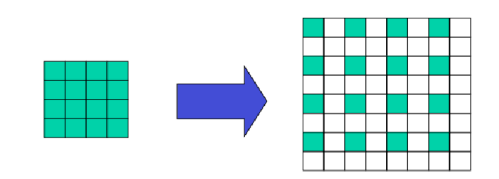

Además, debemos tener cuidado a la hora de calcular la diferencia de la imagen de la gaussiana con respecto a la imagen up-sampled, ya que inicialmente ambas son de tipo 'int', es decir, almacenan la intensidad mediante enteros que se mueven en el rango [0,255]. Su diferencia puede dar lugar a valores negativos, valores que se mueven dentro del rango [-255,255], por lo que debemos convertir ambas imágenes, antes de restarlas, a un tipo de dato que nos ofrezca una mayor capacidad de almacenamiento, en este caso, que sea capaz de trabajar con valores negativos. Yo me he decantado por convertir ambas imágenes de 'int' a 'float32'.

Por ende, las imágenes que conforman mi pirámide Laplaciana serán de tipo 'float', almacenando valores negativos, de tal forma que sólo a la hora de visualizar tendré que normalizar a [0,1] sus valores para poder visualizar la imagen adecuadamente.

## C) (0.5 puntos)

Ahora realice la misma operación que en los apartados anteriores, pero sin suavizar antes de hacer subsampling a la hora de crear la pirámide Gaussiana. ¿Hay diferencias visuales en la pirámide Laplaciana generada? ¿A qué se pueden deber estas?

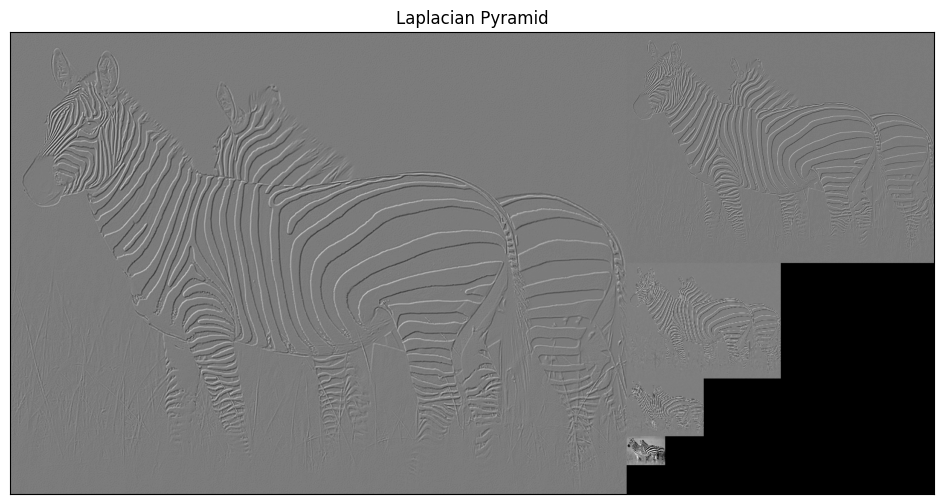

In [ ]:
im=cv2.imread(get_image('zebra.jpg'),0)
pyrL = pyramidLap(im,sizeMask=7,suavizar=False)
pyrL = [rangeDisplay01(image) for image in pyrL]
displayPyramid(pyrL,'Laplacian Pyramid')

Tal y como comenté en el apartado a), no hacer el suavizado previo al subsampling implica no eliminar las altas frecuencias de la imagen cuya resolución queremos reducir, corriendo el riesgo de sufrir 'aliasing' y generando por tanto, imágenes de menor resolución que presentan defectos visuales, tal y como se puede apreciar en la pirámide Laplaciana superior.

## D) (0.5 puntos)

Implemente ahora una función para reconstruir la imagen codificada en la pirámide Laplaciana del apartado 2.B. Verifique que es posible obtener una copia exacta de la imagen original. Para ello, calcule el error de reconstrucción como el _Root Mean Squared Error_ (RMSE) entre los niveles de intensidad de la imagen original y la imagen reconstruida.

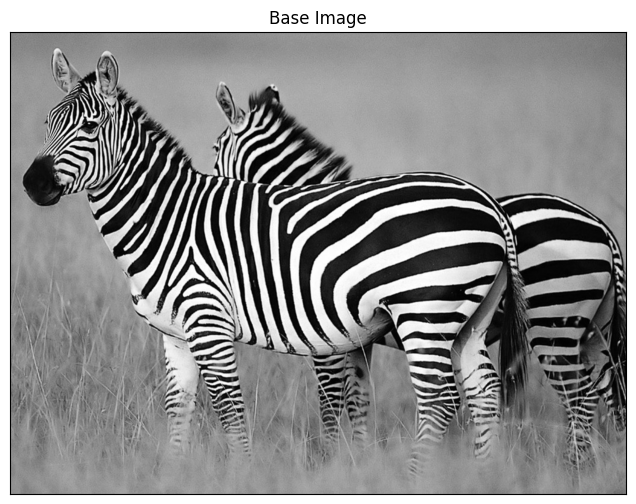

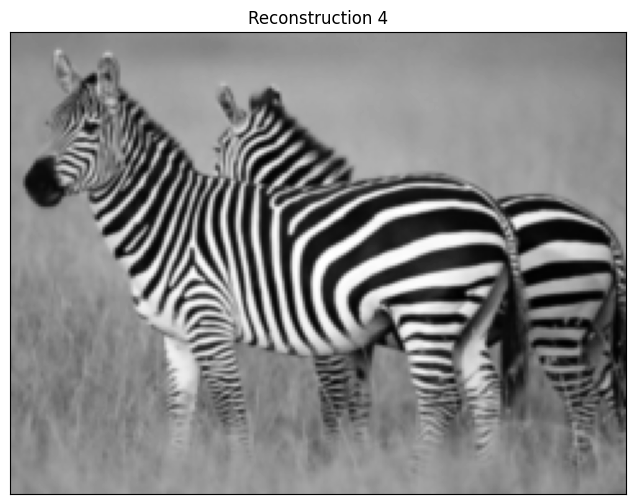

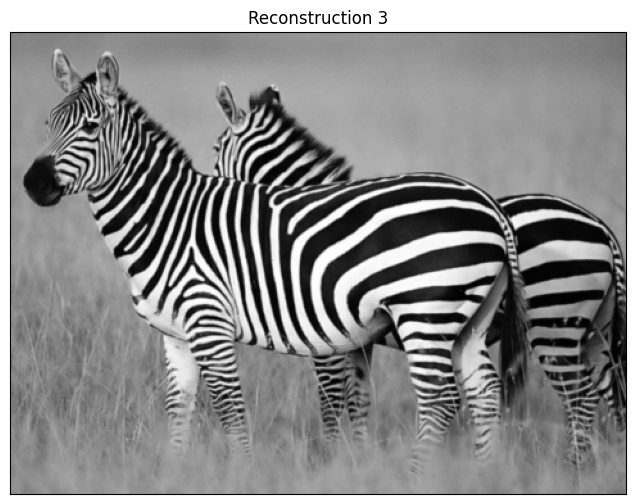

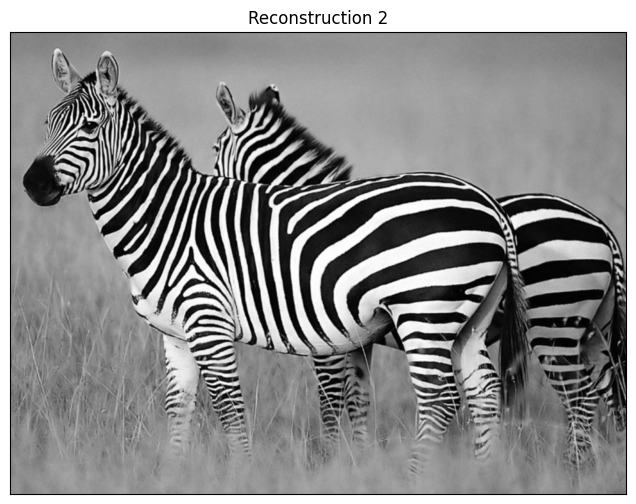

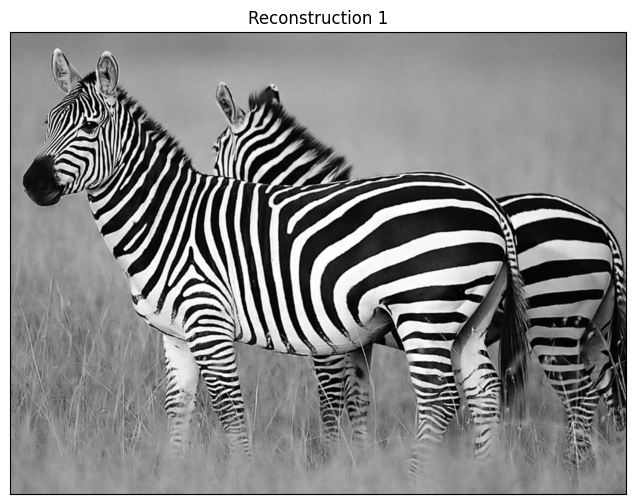

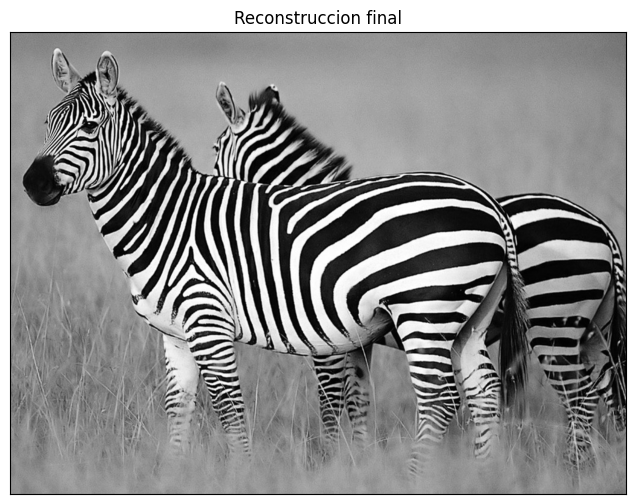

Error per pixel 0.0


In [ ]:
def reconstructLap(pyL,flagInterp=cv2.INTER_LINEAR):
  #recorremos la piramide laplaciana de final a principio, tomando inicialmente la última imagen de la laplaciana
  im=pyL[-1]
  for i in reversed(range(0,len(pyL)-1)):
    #hago zoom x2
    zoom=cv2.resize(im,(pyL[i].shape[1],pyL[i].shape[0]),interpolation=flagInterp)
    #sumo la imagen del siguiente nivel de la laplaciana (frecuencias altas) con la imagen resultante tras hacer zoom sobre la correspondiente en la laplaciana (bajas frecuencias)
    im=pyL[i]+zoom
    displayIm(rangeDisplay01(im),f'Reconstruction {i+1}')
  return im

im=cv2.imread(get_image('zebra.jpg'),0)
displayIm(im,"Base Image")
reconstruccion_final=reconstructLap(pyramidLap(im,sizeMask=7))
displayIm(reconstruccion_final,'Reconstruccion final')
#A CUBRIR POR EL ALUMNADO
print('Error per pixel',np.sqrt(np.mean((im - np.round(reconstruccion_final)) ** 2)))

Una de las principales utilidades de la pirámide Laplaciana es que nos permite reconstruir la imagen original debido principalmente a que preserva las bajas frecuencias a muy baja resolución, y las altas frecuencias en diferentes escalas o resoluciones (zonas detalladas de la imagen). En definitiva, tenemos toda la información necesaria para reconstruir la imagen original.

Además podemos lograr una reconstrucción perfecta (como es el caso), independientemente del $\sigma$ empleado, ya que al suavizar, eliminamos las altas frecuencias, por lo que vamos a poder reducir el nº de píxeles de la imagen suavizada sin perder información relevante (anti-aliasing), según nos indica el Teorema de Nyquist-Shannon, de tal forma que los píxeles restantes son suficientes para representar completamente las frecuencias bajas de la imagen.

# **Ejercicio 3: Imágenes Híbridas** (1.5 puntos)

Este ejercicio se basa en el siguiente trabajo: $\textit{Oliva, A., Torralba, A., & Schyns, P. G. (2006). Hybrid images. ACM Transactions on Graphics (TOG), 25(3), 527-532}$ (https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf). Vamos a aprender cómo el sistema visual humano extrae información sobre un objeto en función de la distancia. Para ello, construimos una imagen híbrida a partir de dos imágenes de objetos diferentes. Mezclando adecuadamente parte de las altas frecuencias de una imagen con parte de las bajas frecuencias de otra imagen, obtenemos una imagen híbrida que muestra diferentes percepciones con la distancia. El sigma empleado para filtrar ambas imágenes (tanto la de alta como la de bajas frecuencias) es el aspecto clave para seleccionar el rango de frecuencias altas y bajas de cada imagen. Cuanto mayor sea el valor sigma, mayor será la eliminación de altas frecuencias de la imagen. Se recomienda elegir este valor por separado para cada una de las imágenes y, de hecho, seguramente sea posible (y deseable) el tener distintos valores para distintos pares de imágenes.

Aspectos de importancia en relación a este ejercicio:

1. Como mínimo, se deben generar las imágenes híbridas correspondientes a `'cat.bmp'+'dog.bmp'`, `'submarine.bmp'+'fish.bmp'` y `'marilyn.bmp'+'einstein.bmp'` (todas ellas en escala de grises). Se debe emplear una pirámide Gaussiana con 5 niveles para mostrar el efecto obtenido.
2. No es necesario seguir al pie de la letra el artículo de referencia y operar en el dominio de la frecuencia (Fourier). Basta con operar en el dominio del espacio, como hemos hecho en todos los demás apartados de esta práctica.
3. Se debe explicar con claridad el criterio empleado para escoger la imagen de altas y la imagen de bajas frecuencias, así como el proceso seguido para filtrar la imagen de altas frecuencias y la de bajas frecuencias (incluyendo la elección de los sigmas finalmente utilizados; es decir, no sería suficiente indicar sucintamente que "se procedió por medio de prueba y error hasta obtener el sigma final").

Las imágenes híbridas previas nos ofrecen una doble interpretación en función de la distancia desde la que visualicemos dicha imagen, visualizando una figura u otra. Si nos acercamos a la imágen híbrida, visualizaremos la imagen para la que hemos preservado únicamente las altas frecuencias. Esto tiene sentido, ya que, tal y como ocurre con la vista humana, cuanto menor sea la distancia a la que nos situemos del objetivo a visualizar, mayor será la cantidad de detalles que logramos apreciar, es decir, mayor será la cantidad de altas frecuencias que logramos detectar, y por ende, apreciaremos la imagen de altas frecuencias. Sin embargo, alejarnos implica perder esa capacidad de detectar los detalles, visulizando únicamente las zonas en las que se producen cambios de intensidad más graduales, y por ende, las bajas frecuencias (imagen de bajas frecuencias).

A la hora de generar una imágen híbrida, debemos comenzar decidiendo la imagen de la que vamos a tomar las altas frecuencias, y la que tomaremos para preservar las bajas frecuencias:
- Tomaremos como imagen de altas frecuencias aquella que contenga una mayor cantidad de detalles, utilizando esos detalles para visualizar dicha imagen situándonos cerca de la híbrida. Al aplicar un high-pass filter sobre la imagen de altas frecuencias, preservamos únicamente las altas frecuencias.
- Tomaremos como imagen de bajas frecuencias aquella que contenga una mayor cantidad de frecuencias bajas, con el objetivo de utilizar esas frecuencias para visualizar la imágen situándonos lejos de la híbrida. Al aplicar un low-pass filter sobre la imagen de bajas frecuencias, nos quedaremos únicamente con las bajas frecuencias.

En resumen, nos interesa tomar la máxima información posible de cada una de las imágenes (extrayendo de una las bajas frecuencias, y de la otra, las altas). Como la información que extraemos de una de las dos está asociada a las bajas frecuencias, será conveniente seleccionar aquella que contenga más información correspondiente a las bajas frecuencias (=mayor cantidad de bajas frecuencias). Igual para seleccionar la de altas frecuencias.

En cuanto al 'sigma' empleado para definir los filtros de pase alto y bajo...

Sabemos que cuanto mayor sea el 'sigma' de la gaussiana, mayor será la potencia de suavizado, es decir, mayor será la cantidad de frecuencias que se consideran 'altas', eliminando mayor cantidad de detalles de la imagen. Esto implicaría que, al aplicar el filtro gaussiano a la imagen de bajas frecuencias, menor será la cantidad de frecuencias bajas que se preservan, y por ende, menos información. En cuanto al high-pass filter aplicado a la otra imagen, este incremento del sigma supondría tomar una mayor cantidad de frecuencias consideradas como 'altas', y por ende, más información de esta segunda imagen.

Por ende, es importante buscar un 'sigma' que nos permita lograr un equilibrio entre la información que tomamos de una imagen y otra, ya que, como acabamos de ver, variaciones del 'sigma' supone capturar mayor información de una imagen pero menos de otra. Además, conseguir ese equilibrio evita justamente el hecho de que una imagen predomine sobre la otra, al generar la correspondiente imágen híbrida.

Tal y como he comentado, voy a proceder a decidir, para cada pareja de imágenes, cuál de ellas se le aplicará un filtro de pase bajo, y a cuál un filtro de pase alto. Por ende, voy a implementar el siguiente código que realiza los siguientes pasos:
1. Aplicamos la transformada de Forurier sobre cada imagen, pasando del espacio tiempo al espacio de frecuencias 2D, donde el eje X marca las frecuencias horizontales, y el eje Y las frecuencias verticales (ya que una imagen está conformada por frecuencias verticales y horizontales). En este caso, nuestro ordenador trabajará con la transformada 'discreta' de Fourier  (forma de trabajar, a nivel computacional, con la transformada de Fourier de una imagen), que viene definida por una matriz 2D de números complejos, donde cada entrada de índice 'i' y 'j' tiene asociada la siguiente información:
  - La fila 'i' y columna 'j' equivalen a las frecuencias horizontal 'i' y vertical 'j', respectivamente.
  - Dicha entrada es un número complejo que contiene información tanto sobre la amplitud de la frecuencia (i,j) (que determina su contribución en la imagen, es decir, su presencia en dicha imagen)  como la fase (dónde se localiza dicha frecuencia en la imagen original). Esta entrada se denomina 'coeficiente de Fourier'.

2. Calculo la magnitud de cada una de las frecuencias.
3. Procedo a eliminar las bajas frecuencias, preservando únicamente las altas frecuencias. Para ello, necesito definir un umbral, que me permita definir las frecuencias que se consideran 'bajas'. Ese umbral representa un cuadrado centrado en el origen de la imagen en el dominio de frecuencias, de lado '2 veces el umbral', tal que todas aquellas frecuencias que caigan en dicho umbral se considerarán como 'bajas' y se eliminarán, teniendo en cuenta únicamente la magnitud del resto de frecuencias (altas).
4. Una vez eliminadas las bajas frecuencias, procedo a sumar la magnitud del resto, dando como resultado una medida de la cantidad de altas frecuencias de la imagen correspondiente.

In [ ]:
def calcular_altas_frecuencias(image, umbral=30):
    # Aplicamos la Transformada de Fourier en 2D
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)  #centramos el origen al centro

    #calculamos la magnitud de las frecuencias, que expresan cuánto constribuye cada una de ellas en la imagen del dominio espacial
    magnitudes = np.abs(fshift)

    #Creamos una mascara 2D del mismo tamaño que la imagen, cuyas entradas valdrán todas '1' menos un entorno de su centro, con todos sus elementos a 0
    #Al multiplicar dicha mascara por la transformada de la imagen (centrando antes el origen al centro), estaremos eliminando todas aquellas frecuencias situadas en dicho entorno del origen, es decir, las bajas frecuencias, quedandonos
    #únicamente con las altas frecuencias
    filas, columnas = image.shape
    fila_centro, columna_centro = filas // 2 , columnas // 2
    mascara = np.ones((filas, columnas), np.uint8)
    mascara[fila_centro-umbral:fila_centro+umbral, columna_centro-umbral:columna_centro+umbral] = 0

    # aplicamos la mascara sobre las magnitudes de las frecuencias de la imagen, consiguiendo eliminar aquellas asociadas a bajas frecuencias (según el umbral definido)
    magnitud_total = magnitudes * mascara
    #sumamos las magnitudes de las frecuencias consideradas como 'altas' según ese umbral, expresando así la energía total de las altas frecuencias
    energia = np.sum(magnitud_total)

    return energia

In [ ]:
imagenes=[('cat.bmp','dog.bmp'),('submarine.bmp','fish.bmp'),('marilyn.bmp','einstein.bmp')]
for (name1,name2) in imagenes:
  #leemos ambas imagenes
  im1=cv2.imread(get_image(name1),0)
  im2=cv2.imread(get_image(name2),0)

  #calculamos altas frecuencias
  hf1=calcular_altas_frecuencias(im1)
  hf2=calcular_altas_frecuencias(im2)

  print(f"* Altas frecuencias de {name1} --> ",hf1)
  print(f"* Altas frecuencias de {name2} --> ",hf2)

  if hf1 > hf2:
        print(f"La imagen con más altas frecuencias es: {name1}\n")
  else:
        print(f"La imagen con más altas frecuencias es: {name2}\n")

* Altas frecuencias de cat.bmp -->  271130655.1091181
* Altas frecuencias de dog.bmp -->  317580108.54126155
La imagen con más altas frecuencias es: dog.bmp

* Altas frecuencias de submarine.bmp -->  74271723.92253847
* Altas frecuencias de fish.bmp -->  197159105.83366656
La imagen con más altas frecuencias es: fish.bmp

* Altas frecuencias de marilyn.bmp -->  101751296.94885404
* Altas frecuencias de einstein.bmp -->  181210876.9765244
La imagen con más altas frecuencias es: einstein.bmp



Los resultados obtenidos nos indican, para cada pareja de imágenes, la que será empleada para tomar sus altas frecuencias. La otra se utilizará para preservar las bajas frecuencias. Procedo ahora a implementar el código de generación de las correspondientes imágenes híbridas.

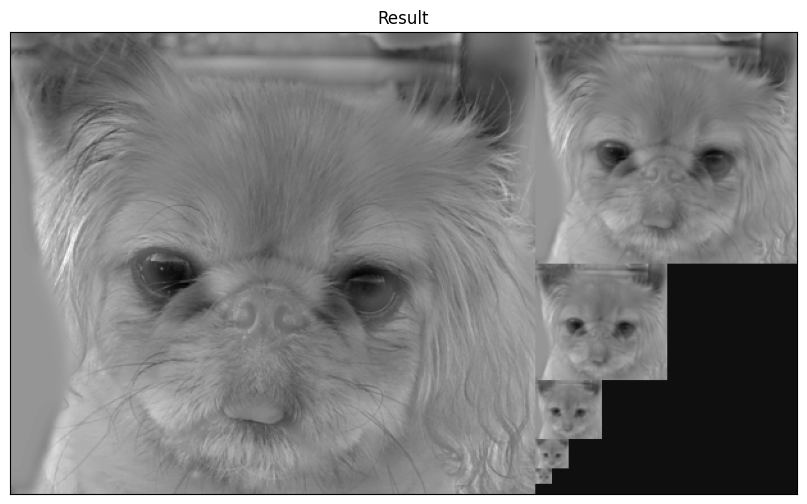

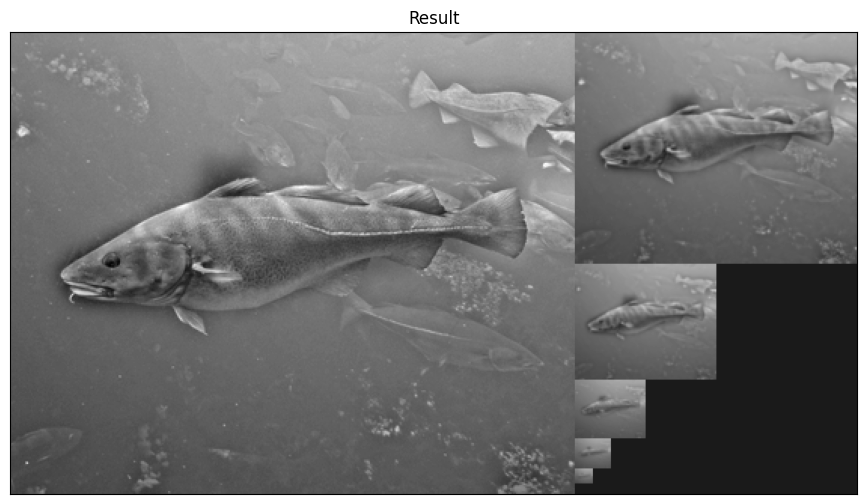

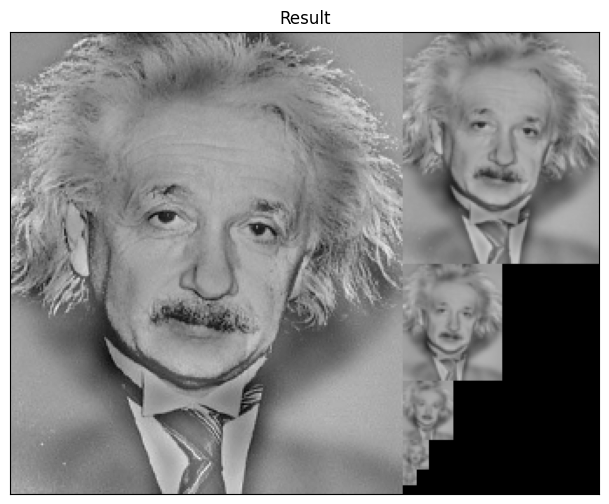

In [ ]:
#el siguiente listado de imagenes esta definido de tal forma que para cada pareja de imagenes, se aplicará un filtro de pase bajo a la 1ª imagen, y uno de pase alto a la segunda
imagenes=[('cat.bmp','dog.bmp'),('submarine.bmp','fish.bmp'),('marilyn.bmp','einstein.bmp')]
sigmas=[(6,6),(6,6),(6,6)]

for (name1,name2),(sigma1,sigma2) in zip(imagenes,sigmas):
  #leemos ambas imagenes
  im1=cv2.imread(get_image(name1),0)
  im2=cv2.imread(get_image(name2),0)
  #importante que la imagen de salida sea de tipo float, para evitar saturaciones en futuras operaciones...
  #aplico filtro pase bajo
  im1=cv2.sepFilter2D(im1, cv2.CV_64F, gaussianMask1D(sigma1), gaussianMask1D(sigma1))
  #aplico filtro pase alto
  im2=im2-cv2.sepFilter2D(im2, cv2.CV_64F, gaussianMask1D(sigma2), gaussianMask1D(sigma2))
  #generamos imagen hibrida y visualizamos por pantalla
  hibrida=im1+im2
  pyrG = pyramidGauss(hibrida,sizeMask=7, nlevel=5)
  displayPyramid(pyrG,'Result')


He probado inicialmente con un mismo sigma para todas las parejas de imágenes, obteniendo imágenes híbridas correctas. Este buen comportamiento se puede apreciar visualizando la pirámide Gaussiana correspondiente, tal que cuanto mayor sea el nivel de la pirámide, más predominará la imagen escogida para preservar sus bajas frecuencias, justamente por el hecho de que en la pirámide gaussiana suavizamos antes de hacer downsampling.

A la hora de aplicar el filtro gaussiano, podríamos optar por realizar el suavizado gaussiano trabajando en el espacio de frecuencias, lo que reduce mucho el coste computacional, ya que realizar una convolución en el dominio espacial es equivalente a realizar multiplicaciones en el dominio de frecuencias (Teorema de Convolución).

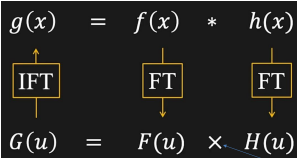

Sin embargo, tendríamos que tomar una serie de precauciones:
1. Debemos aplicar la transformada de Fourier de la función Gaussiana 2D, que da lugar a una función gaussiana en el dominio de frecuencias. Cabe mencionar algo especial: variaciones del 'sigma' producen efectos opuestos en la gaussiana y en su transformada. A mayor sigma, mayor será la anchura de la campana de Gauss en el dominio espacial. Sin embargo, en su transformada, este incremento del sigma produce el efecto opuesto: estrecha aún más la campana de Gauss en el dominio de frecuencias. Además, la gaussiana en el dominio de frecuencia debe ocupar toda la transformada de la imagen.
2. No podemos aplicar directamente la transformada de la Gaussiana sobre la transformada de la imagen original, ya que la transformada de la Gaussiana espera que el origen se sitúe en el centro. Sin embargo, la transformada de la imagen nos da una matriz donde el origen se sitúa en la esquina superior izquierda. Por ende, es necesario que hagamos un desplazamiento del origen para situarlo en el centro, consiguiendo que las frecuencias bajas se sitúen en el centro, y las más altas, cerca de los extremos.
3. Tras realizar el paso 2, podemos aplicar la transformada gaussiana sobre la transformada de la imagen original, equivalente a un producto elemento a elemento, multiplicando cada valor de la trasf. gaussiana por el coeficiente de Fourier de la frecuencia correspondiente del dominio de frecuencias.
4. Aplicamos la inversa de la transformada, obteniendo la imagen original suavizada.

Nota: por esta razón, incrementar el 'sigma' reflejaba una mayor potencia de suavizado, ya que este incremento del sigma supone una campana de Gauss más estrecha en el dominio de frecuencias, equivalente a reducir el entorno del origen de dicho dominio que sobrevive, preservando una menor variedad de frecuencias (las más cercanas al origen, bajas frecuencias).

# **Ejercicio 4: Pyramid Blending** (1 punto)

En este ejercicio se debe crear la imagen fusionada de la manzana (`apple.jpg`; parte superior de la imagen fusionada final) y la naranja (`orange.jpg`; parte inferior de la imagen fusionada final) empleando la técnica de $\textit{Pyramid Blending}$. Para este ejercicio, si se desea, sí se pueden emplear las funciones de OpenCV `pyrDown` y `pyrUp`.

Se debe:
1. explicar en detalle el proceso seguido a la hora de crear la nueva imagen (mezcla de ambas);
2. comparar el resultado con la combinación de las imágenes sin emplear _blending_, es decir, juntando directamente los píxeles de la mitad superior de una imagen con la mitad inferior de la otra;
3. mostrar los estados intermedios del procesado. Es decir, las pirámides Gaussianas calculadas para cada imagen (5 niveles cada una), las pirámides Laplacianas correspondientes, y los distintos niveles en que se va mezclando la imagen de salida (es decir, la reconstrucción en el nivel 1, la reconstrucción en el nivel 2,... y así sucesivamente hasta mostrar la imagen final reconstruida/_blended_).  



Vamos a comenzar aplicando el pegado de ambas imágenes usando la pirámide Laplaciana, y tras ello, compararemos el resultado obtenido con el correspondiente si simplemente pegásemos ambas imágenes sin emplear ninguna estrategia adicional.

Comenzamos leyendo las dos imágenes a pegar entre sí. Como ambas imágenes no tienen la misma resolución, tomamos aquella de mayor resolución (en este caso, la naranja), y eliminamos una fila y dos columnas suyas.

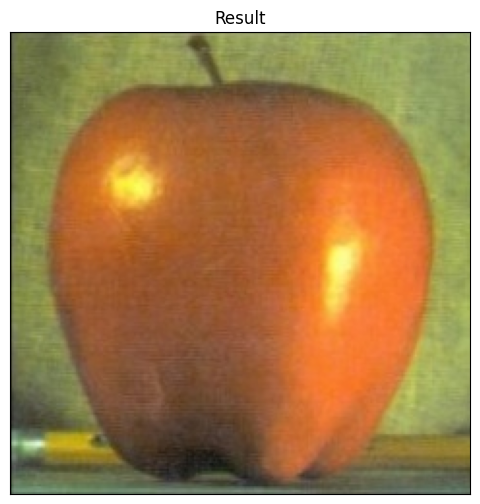

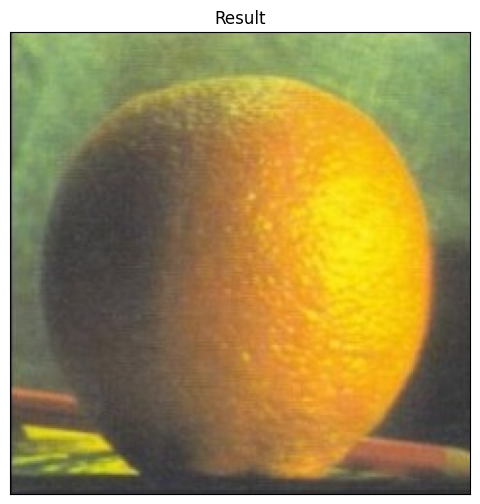

In [ ]:
#comenzamos leyendo las imagenes que queremos unir
manzana=readIm(get_image('apple.jpg'),1)
naranja=readIm(get_image('orange.jpg'),1)
#las dos imagenes a combinar no tienen el mismo tamaño, en este caso optamos por eliminar una fila y dos columnas de la imagen mas grande (naranja)
naranja=np.delete(np.delete(naranja,[0],axis=0),[0,-1],axis=1)
#print(manzana.shape,naranja.shape)
displayIm(manzana)
displayIm(naranja)

Procedemos ahora a generar las pirámides Laplacianas de ambas imágenes. Una vez hecho esto, tendremos que definir una máscara del mismo tamaño que las imágenes iniciales, la cual represente qué sección de las imágenes se pegarán entre si, formada por 0's y 1's, que a la hora de visualizar, serán equivalentes a píxeles negros y blancos. Esto es, la máscara estará conformada por dos zonas: una blanca (que representa la sección a tomar de una imagen) y otra negra (que representa la sección a tomar de la otra imagen).

En este caso, me he decantado por pegar la mitad superior de la manzana con la mitad inferior de la naranja, por lo que la mitad superior de mi máscara será blanca, y la inferior, negra.
Para lograr que la transición de una imagen a otra (en la imagen resultante) se realice de una forma más gradual (obteniendo una imagen final menos artificial), suavizaremos la máscara inicial, lo que hará que la transición del blanco al negro (o viceversa) no se realice de forma brusca, sino gradualmente, empleando grises de diferentes niveles. Tras esto último, generamos la pirámide gaussiana de la máscara, con la intención de aplicar cada máscara de la pirámide con las imagenes de las frutas situadas en el mismo nivel de sus correspondientes pirámides laplacianas.

In [ ]:
pyrG_naranja=pyramidGauss(naranja,sizeMask=7,nlevel=5)
pyrG_manzana=pyramidGauss(manzana,sizeMask=7,nlevel=5)
#generamos la piramide laplaciana de ambas imagenes
pyrL_naranja = pyramidLap(naranja,sizeMask=7,nlevel=5)
pyrL_manzana = pyramidLap(manzana,sizeMask=7,nlevel=5)
#generamos la mascara y su correspondiente piramide laplaciana
mascara=np.zeros((manzana.shape[0],manzana.shape[1]),dtype=np.float32)
filas = manzana.shape[0]
mascara[:int(filas/2),:]=1.0
#ademas, definire una banda intermedia de grises
#suavizo la mascara original antes de generar la piramide gaussiana correspondiente
mascara=cv2.sepFilter2D(mascara,ddepth=-1,kernelX=gaussianMask1D(sizeMask=41),kernelY=gaussianMask1D(sizeMask=41))
pyrG_mascara = pyramidGauss(mascara,sizeMask=7,nlevel=5)

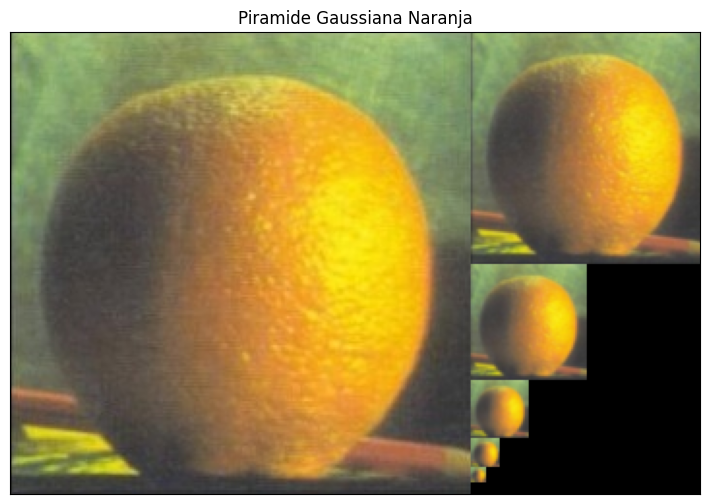

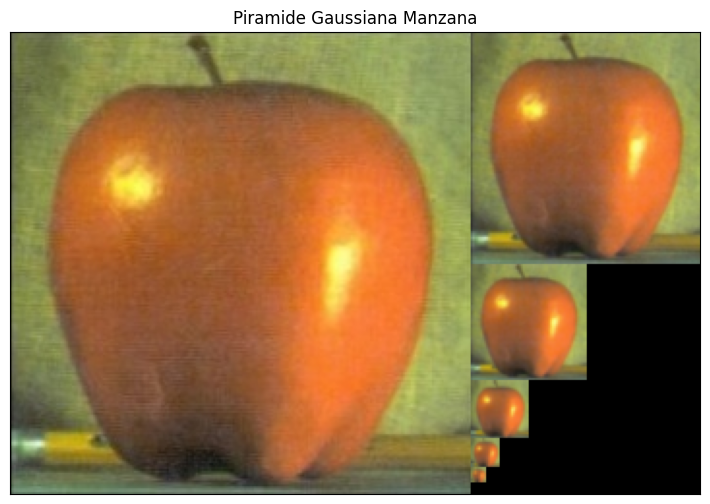

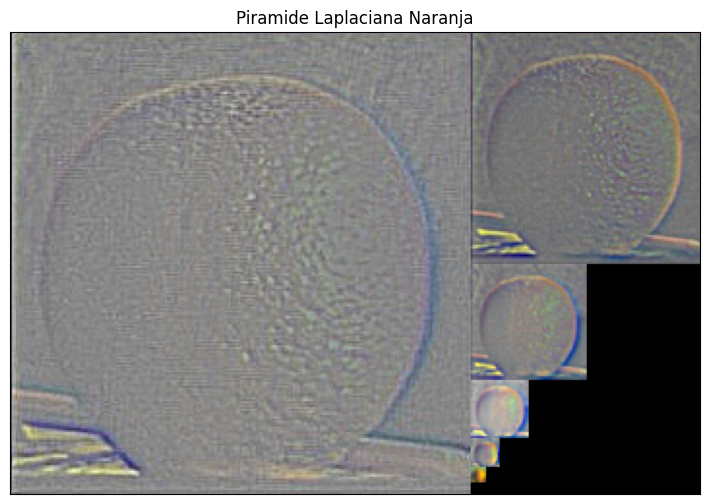

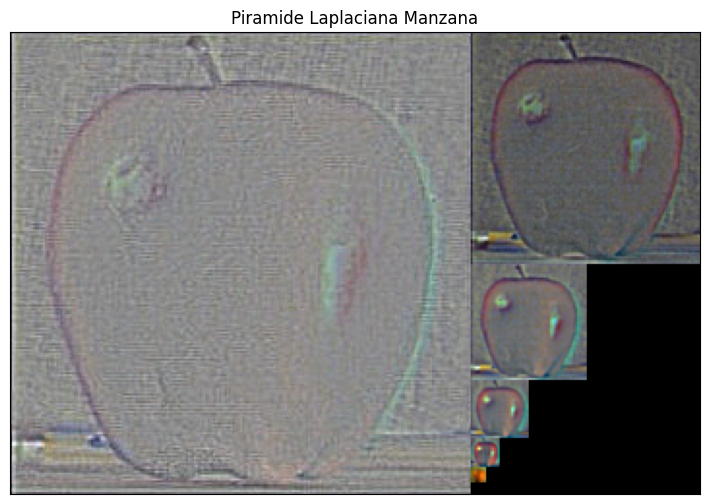

In [ ]:
displayPyramid(pyrG_naranja,"Piramide Gaussiana Naranja")
displayPyramid(pyrG_manzana,"Piramide Gaussiana Manzana")
piramide=[rangeDisplay01(im) for im in pyrL_naranja]
displayPyramid(piramide,"Piramide Laplaciana Naranja")
piramide=[rangeDisplay01(im) for im in pyrL_manzana]
displayPyramid(piramide,"Piramide Laplaciana Manzana")

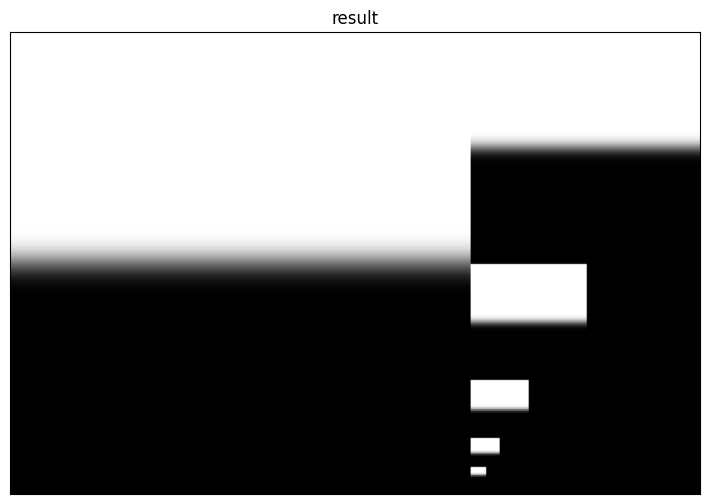

In [ ]:
piramide=[rangeDisplay01(im) for im in pyrG_mascara]
displayPyramid(piramide)

A continuación, se realizan los siguientes pasos:
- Aplicamos la máscara sobre la manzana, recorriendo los diferentes niveles de ambas pirámides. Mismo proceso para la naranja, pero invirtiendo la máscara, es decir, intercambiando la sección blanca de dicha máscara por la negra, ya que la zona blanca siempre marca la región de la imagen que se va a seleccionar, y en el caso de la naranja, queremos quedarnos con la mitad inferior.
- Sumamos, para cada nivel, los resultados obtenidos tras aplicar la máscara en dicho nivel sobre la manzana y la naranja, construyendo la pirámide Laplaciana de la imagen resultante tras el pegado.

In [ ]:
#generamos piramide laplaciana de la imagen resultante de combinar las dos frutas
blending_pyramid=[]
for i in range(len(pyrL_naranja)):
  #necesitamos adaptar la mascara para poder aplicarla sobre imagenes RGB (3 canales)
  mask_rgb = np.dstack([pyrG_mascara[i]] * 3)
  combinacion=pyrL_manzana[i]*mask_rgb+pyrL_naranja[i]*(1-mask_rgb)
  blending_pyramid.append(combinacion)

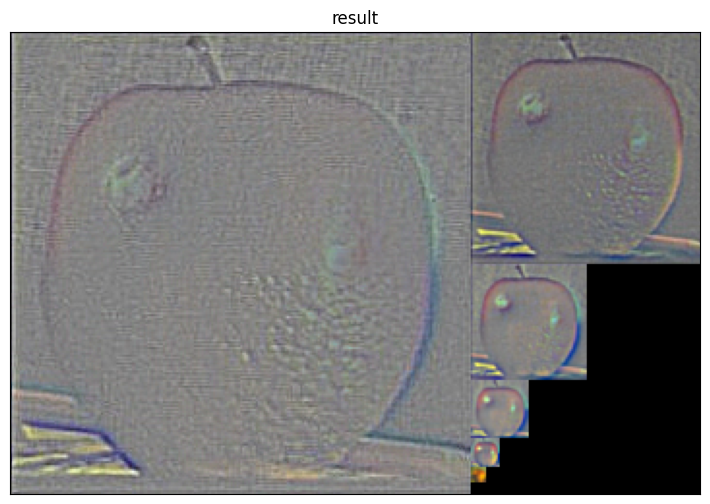

In [ ]:
piramide=[rangeDisplay01(im) for im in blending_pyramid]
displayPyramid(piramide)

Por último, simplemente reconstruimos la imagen a partir de la pirámide Laplaciana construida.

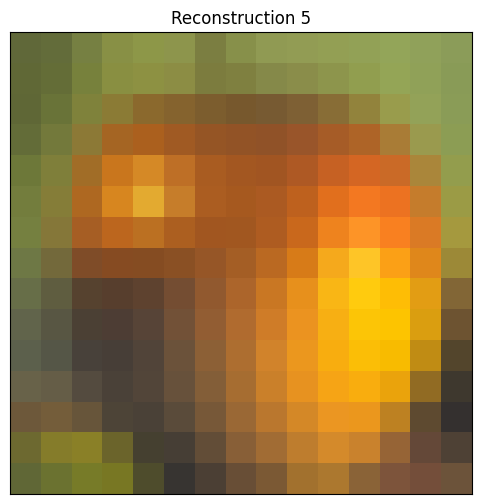

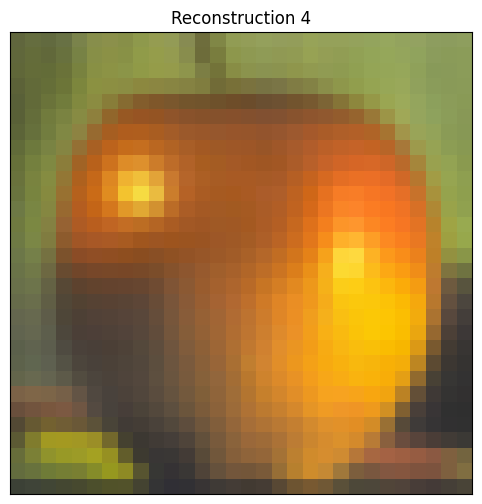

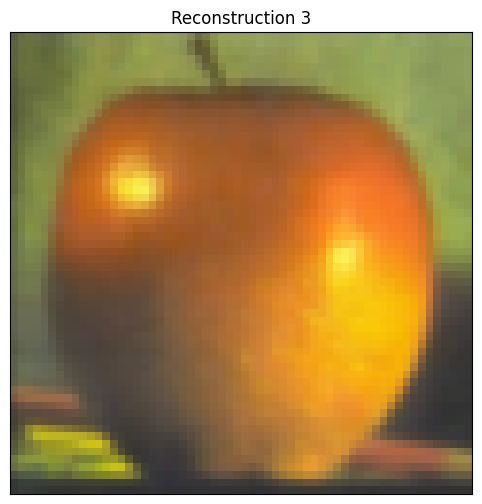

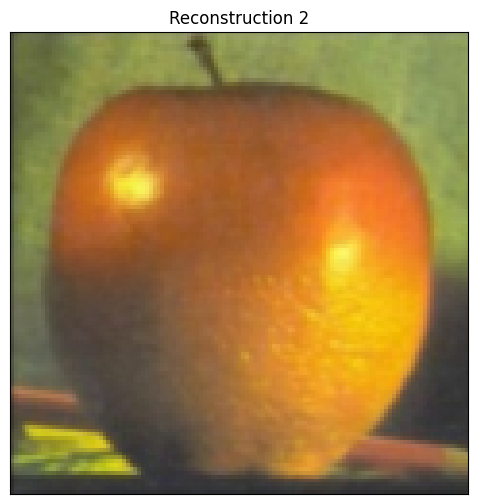

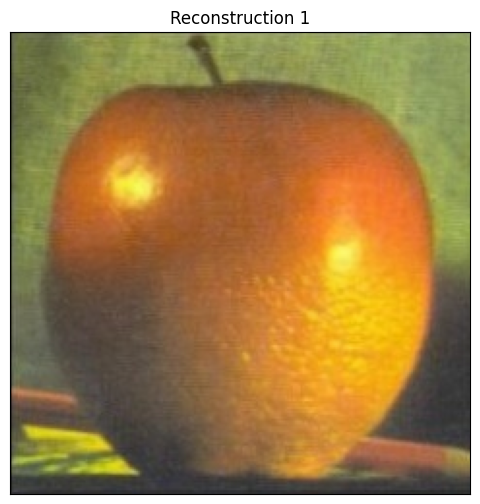

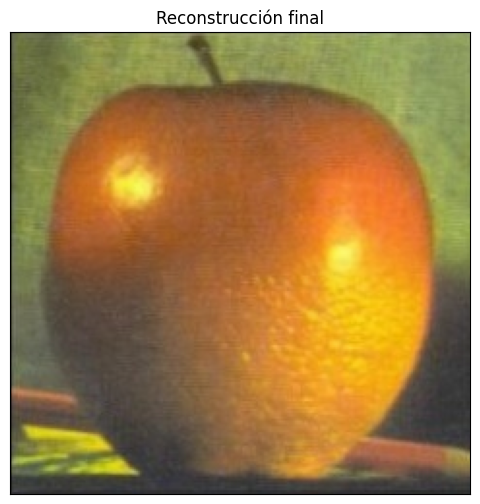

In [ ]:
imagen_final=reconstructLap(blending_pyramid)
displayIm(rangeDisplay01(imagen_final),'Reconstrucción final')

Tal y como se puede apreciar, suavizar inicialmente la máscara nos ha permitido lograr una transición gradual cuando pasamos de una fruta a otra, y consiguiendo un pegado aceptable.

Por último, pegaré ambas imágenes sin emplear la pirámide Laplaciana, simplemente definiendo la máscara que representa qué partes de cada imagen se emplearán en ese pegado, y sin aplicarle ningún tipo de suavizado.

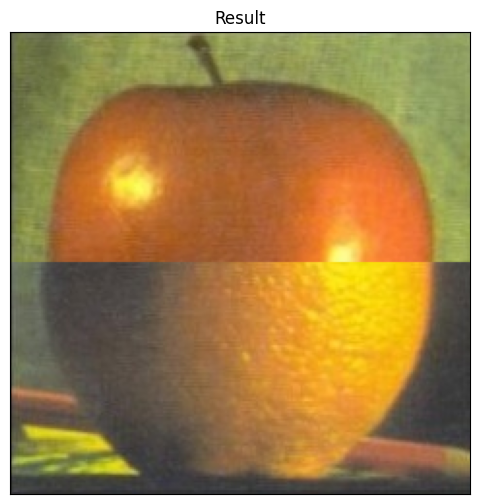

In [ ]:
#redifinimos la mascara para que se pueda aplicar a una imagen RGB (3 canales)
mascara=np.zeros((manzana.shape[0],manzana.shape[1]),dtype=np.float32)
filas = manzana.shape[0]
mascara[:int(filas/2),:]=1.0
mascara_rgb = np.dstack([mascara]*3)
pegado=manzana*mascara_rgb+naranja*(1-mascara_rgb)
displayIm(rangeDisplay01(pegado))

Comparando los resultados obtenidos al pegar ambas imágenes empleando y sin emplear la pirámide Laplaciana, podemos apreciar que la imagen resultante obtenida pegando directamente las imágenes originales es muy artifical y poco natural. Es más, simplemente el hecho de suavizar la máscara de pegado al inicio daría unos resultados mucho mejores, al hacer que la transición de la parte superior a la inferior de dicha máscara se realice de forma mas gradual, lo que supondría a su vez una transición más gradual de una imagen a otra (tras pegarlas).